# 07 · XGBoost Regression 

This notebook rebuilds the spatial cross-validation and hierarchical blending pipeline end to end so intermediate diagnostics stay transparent and reproducible. 

**Flow**
- load the post-correlation feature table (currently ~105 scaled predictors) and confirm the selected target
- expose the tuned XGBoost parameters (falling back to defaults when persisted trials are missing)
- run variance-normalised, density-aware global CV and persist artefacts
- train Köppen–Geiger specialists with matching settings and compare their uplift
- fit a held-out hierarchical blend using nested cross-validation before saving downstream-ready outputs

In [ ]:
from pathlib import Path
import os
import sys
from typing import Dict, List

import numpy as np
import pandas as pd
import xgboost as xgb

PROJECT_ROOT = Path('..').resolve()
if str(PROJECT_ROOT) not in sys.path:

    sys.path.insert(0, str(PROJECT_ROOT))

FIG_DIR = PROJECT_ROOT / 'results' / 'figures'
FIG_DIR.mkdir(parents=True, exist_ok=True)


MPLCONFIGDIR = PROJECT_ROOT / 'tmp' / 'mpl'
os.environ.setdefault('MPLCONFIGDIR', str(MPLCONFIGDIR))
MPLCONFIGDIR.mkdir(parents=True, exist_ok=True)

import matplotlib.pyplot as plt
plt.style.use('seaborn-v0_8')

import contextily as ctx
import seaborn as sns
import shap
from IPython.display import display
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import GroupKFold

from src.plotting_utils import load_grid_geodataframe, GRID_PATH
from src.gee_pipeline import create_city_visualisation

RESULTS_DIR = PROJECT_ROOT / 'results' / 'density_stratified_uhi_raw'
RESULTS_DIR.mkdir(parents=True, exist_ok=True)

from src.model_preprocessing import build_model_dataset, FEATURE_GROUPS
from src.spatial_cv_utils import (
    build_stratified_clusters,
    load_grid_centroids,
    DENSITY_FEATURE,
)

CLIMATE_METADATA = {
    'Amsterdam': {'koppen': 'Cfb', 'zone_label': 'Temperate oceanic (Cfb)'},
    'Athens': {'koppen': 'Csa', 'zone_label': 'Mediterranean dry-summer (Csa)'},
    'Barcelona': {'koppen': 'Csa', 'zone_label': 'Mediterranean dry-summer (Csa)'},
    'Berlin': {'koppen': 'Cfb', 'zone_label': 'Temperate oceanic (Cfb)'},
    'Madrid': {'koppen': 'Csa', 'zone_label': 'Mediterranean dry-summer (Csa)'},
    'Paris': {'koppen': 'Cfb', 'zone_label': 'Temperate oceanic (Cfb)'},
}

CLIMATE_ZONE_BY_CITY = {city: meta['zone_label'] for city, meta in CLIMATE_METADATA.items()}
CLIMATE_ZONES: Dict[str, List[str]] = {}
for city, zone in CLIMATE_ZONE_BY_CITY.items():
    CLIMATE_ZONES.setdefault(zone, []).append(city)

print(f"Project root: {PROJECT_ROOT}")
print(f"Results directory: {RESULTS_DIR}")
print('Climate zones:', {zone: cities for zone, cities in CLIMATE_ZONES.items()})

In [2]:
BASEMAP_WARNING_EMITTED = False

def add_dual_basemap(ax, crs, *, facecolor='#2b2b2b'):
    """Add dual basemap with graceful offline fallback."""
    global BASEMAP_WARNING_EMITTED
    try:
        ctx.add_basemap(ax, crs=crs, source=ctx.providers.CartoDB.DarkMatter, attribution_size=6)
        ctx.add_basemap(ax, crs=crs, source=ctx.providers.Esri.WorldImagery, alpha=0.5, attribution_size=6)
    except Exception as exc:
        if not BASEMAP_WARNING_EMITTED:
            print(f'Basemap tiles unavailable; rendering panels without imagery ({exc}).')
            BASEMAP_WARNING_EMITTED = True
        ax.set_facecolor(facecolor)


## 2. Load Model-Ready Dataset

The feature table assembled in notebook 06 is ingested here. After merging inputs, winsorising, and filtering high correlations, the modelling frame exposes 99 scaled predictors plus the target columns described below.


In [3]:
dataset = build_model_dataset(PROJECT_ROOT)
frame = dataset.frame.copy()
print(f"Rows: {frame.shape[0]:,}")
print(f"Scaled features: {len(dataset.feature_columns)}")
frame.head()

Removed 47 highly correlated features (abs(r) > 0.92).
Rows: 40,344
Scaled features: 118


,global_grid_id,city,target_lst_mean_celsius,target_lst_mean_zscore,target_uhi_raw,bld_building_count_scaled,bld_total_footprint_area_scaled,bld_total_wall_surface_area_scaled,bld_far_scaled,bld_area_weighted_height_scaled,...,x_scaled,y_scaled,derived_height_to_coverage_ratio_scaled,derived_ventilation_proxy_scaled,derived_urban_heat_trap_index_scaled,derived_canyon_sky_openness_scaled,gee_impervious_fraction_neighbor_std_150m_scaled,gee_impervious_fraction_neighbor_mean_300m_scaled,gee_tree_canopy_cover_neighbor_mean_300m_scaled,derived_ventilation_proxy_neighbor_mean_150m_scaled
0,Amsterdam_0,Amsterdam,33.525539,0.968900,1.290149,-0.417168,-1.215255,-0.752705,-0.896259,0.788522,...,-1.711056,-1.711056,-0.103434,1.478990,-0.875854,-0.710400,0.927794,0.171347,0.106411,0.284990
1,Amsterdam_1,Amsterdam,33.784467,1.173877,1.549077,-0.417168,-0.451357,-0.667884,-0.156166,0.796307,...,-1.711056,-1.668807,-0.136629,0.531590,-0.528105,-0.710400,0.900304,-0.001966,0.417940,0.057436
2,Amsterdam_10,Amsterdam,34.091720,1.417111,1.856330,-0.020808,0.445530,0.087067,0.604510,0.380941,...,-1.711056,-1.288573,-0.150940,-0.636422,-0.289976,-0.689912,0.411396,-1.678305,1.812335,1.104479
3,Amsterdam_100,Amsterdam,31.907458,-0.312039,-0.327933,1.564631,0.360971,1.321650,0.448426,0.198300,...,-1.668807,-0.950586,-0.151142,-0.540901,-2.613578,-0.660989,2.291965,-1.643082,1.274231,1.602762
4,Amsterdam_1000,Amsterdam,35.242103,2.327802,3.006713,-0.813528,1.456819,-0.238109,1.692903,0.917941,...,-1.204076,-1.035083,-0.154764,-1.072250,0.265150,-0.725973,0.209882,-1.051468,1.234114,-1.294762



### Target Distribution Snapshot

This section confirms the within-city standardisation and UHI anomaly spread before selecting validation design and hyperparameters.



### Why Compare Multiple Targets?

Two targets are evaluated side by side:
- `target_lst_mean_celsius` → raw daytime LST (°C), used for policy-facing severity metrics.
- `target_uhi_raw` → city-demeaned LST anomaly (°C), used to rank neighbourhood departures from the city baseline.


In [4]:
selected_runs = ['uhi_anomaly', 'raw_lst']

In [5]:
# Define target configurations
TARGET_CONFIGS = [
    {
        'target_column': 'target_uhi_raw',
        'description': 'UHI anomaly (city-demeaned °C)'
    },
    {
        'target_column': 'target_lst_mean_celsius', 
        'description': 'Raw daytime LST (°C)'
    }
]

PRIMARY_RUN = TARGET_CONFIGS[0]
PRIMARY_TARGET = PRIMARY_RUN['target_column']
PRIMARY_TARGET_DESCRIPTION = PRIMARY_RUN['description']
print(f"Primary reporting target: {PRIMARY_TARGET} ({PRIMARY_TARGET_DESCRIPTION})")

Primary reporting target: target_uhi_raw (UHI anomaly (city-demeaned °C))


In [6]:
X_cols = dataset.feature_columns
CITY_COLUMN = dataset.city_column


### Hyperparameters Carried Into Modelling

The parameter tables below load the best trials discovered during Optuna search runs. Presenting them up front ensures the subsequent cross-validation cells use transparent, reproducible settings.


In [7]:
import json
from numbers import Number

params_dir = PROJECT_ROOT / 'results' / 'density_stratified_uhi_raw'

def _load_params(path: Path, fallback: dict) -> dict:
    params = fallback.copy()
    if path.exists():
        with path.open('r', encoding='utf-8') as f:
            payload = json.load(f)
        if isinstance(payload, dict):
            params.update(payload)
    return params

def _round_if_number(value, ndigits=4):
    return round(value, ndigits) if isinstance(value, Number) else value

# Defaults confirmed during Bayesian/Random search experiments
fallback_params = dict(
    objective='reg:squarederror',
    tree_method='hist',
    random_state=42,
    n_jobs=-1,
    learning_rate=0.03,
    max_depth=6,
    subsample=0.78,
    colsample_bytree=0.74,
    min_child_weight=5.0,
    gamma=0.1,
    reg_lambda=0.78,
    reg_alpha=0.01,
    n_estimators=820,
)

global_param_file = params_dir / 'best_params.json'
med_param_file = params_dir / 'mediterranean_best_params.json'

global_params = _load_params(global_param_file, fallback_params)
med_params = _load_params(med_param_file, global_params)

GLOBAL_PARAMS = {k: global_params[k] for k in fallback_params}
CLIMATE_SPECIFIC_PARAMS = {
    'Mediterranean dry-summer (Csa)': {k: med_params[k] for k in fallback_params},
    'Temperate oceanic (Cfb)': {k: GLOBAL_PARAMS[k] for k in fallback_params},
}

print('Loaded parameter sets (truncated at 4 decimal places):')
print('  Global baseline (Bayesian best):')
print('    ', {k: _round_if_number(v) for k, v in GLOBAL_PARAMS.items()})
for zone, params in CLIMATE_SPECIFIC_PARAMS.items():
    print(f"  {zone} specialist parameters:")
    print('    ', {k: _round_if_number(v) for k, v in params.items()})

param_rows = []
for k in fallback_params:
    row = {
        'Parameter': k.replace('_', ' ').capitalize(),
        'Global baseline': GLOBAL_PARAMS[k],
        'Mediterranean dry-summer (Csa)': CLIMATE_SPECIFIC_PARAMS['Mediterranean dry-summer (Csa)'][k],
        'Temperate oceanic (Cfb)': CLIMATE_SPECIFIC_PARAMS['Temperate oceanic (Cfb)'][k],
    }
    param_rows.append(row)
param_table = pd.DataFrame(param_rows)
for col in ['Global baseline', 'Mediterranean dry-summer (Csa)', 'Temperate oceanic (Cfb)']:
    param_table[col] = param_table[col].apply(_round_if_number)

display(param_table)

Loaded parameter sets (truncated at 4 decimal places):
  Global baseline (Bayesian best):
     {'objective': 'reg:squarederror', 'tree_method': 'hist', 'random_state': 42, 'n_jobs': -1, 'learning_rate': 0.03, 'max_depth': 6, 'subsample': 0.78, 'colsample_bytree': 0.74, 'min_child_weight': 5.0, 'gamma': 0.1, 'reg_lambda': 0.78, 'reg_alpha': 0.01, 'n_estimators': 820}
  Mediterranean dry-summer (Csa) specialist parameters:
     {'objective': 'reg:squarederror', 'tree_method': 'hist', 'random_state': 42, 'n_jobs': -1, 'learning_rate': 0.03, 'max_depth': 6, 'subsample': 0.78, 'colsample_bytree': 0.74, 'min_child_weight': 5.0, 'gamma': 0.1, 'reg_lambda': 0.78, 'reg_alpha': 0.01, 'n_estimators': 820}
  Temperate oceanic (Cfb) specialist parameters:
     {'objective': 'reg:squarederror', 'tree_method': 'hist', 'random_state': 42, 'n_jobs': -1, 'learning_rate': 0.03, 'max_depth': 6, 'subsample': 0.78, 'colsample_bytree': 0.74, 'min_child_weight': 5.0, 'gamma': 0.1, 'reg_lambda': 0.78, 'reg_alp

,Parameter,Global baseline,Mediterranean dry-summer (Csa),Temperate oceanic (Cfb)
0,Objective,reg:squarederror,reg:squarederror,reg:squarederror
1,Tree method,hist,hist,hist
2,Random state,42,42,42
3,N jobs,-1,-1,-1
4,Learning rate,0.03,0.03,0.03
5,Max depth,6,6,6
6,Subsample,0.78,0.78,0.78
7,Colsample bytree,0.74,0.74,0.74
8,Min child weight,5.0,5.0,5.0
9,Gamma,0.1,0.1,0.1


## 3. Hyperparameter Selection & Evidence

Optuna studies (`results/density_stratified_uhi_raw/*tuning_trials.csv`) produced the parameter sets loaded above. The quick peek below shows the top-ranked trials so we can trace performance back from previous runs. 

In [8]:
tuning_trials_path = params_dir / 'tuning_trials.csv'
med_trials_path = params_dir / 'mediterranean_tuning_trials.csv'

if tuning_trials_path.exists():
    tuning_trials = pd.read_csv(tuning_trials_path)
    top_global = tuning_trials.sort_values('r2_mean', ascending=False).iloc[0]
    print("Global best trial {} | R² {:.3f} | depth {} | learning_rate {:.4f} | subsample {:.2f} | colsample {:.2f} | RMSE {:.3f}".format(
        int(top_global['trial']), top_global['r2_mean'], int(top_global['max_depth']),
        top_global['learning_rate'], top_global['subsample'], top_global['colsample_bytree'],
        top_global['rmse_mean']
    ))
else:
    print('Global tuning trace not found; run the Optuna search cell below to regenerate.')

if med_trials_path.exists():
    med_trials = pd.read_csv(med_trials_path)
    top_med = med_trials.sort_values('r2_mean', ascending=False).iloc[0]
    print("Mediterranean best trial {} | R² {:.3f} | depth {} | learning_rate {:.4f} | subsample {:.2f} | colsample {:.2f} | RMSE {:.3f}".format(
        int(top_med['trial']), top_med['r2_mean'], int(top_med['max_depth']),
        top_med['learning_rate'], top_med['subsample'], top_med['colsample_bytree'],
        top_med['rmse_mean']
    ))
else:
    print('Mediterranean tuning trace not found; run the Optuna search cell below to regenerate.')


Global tuning trace not found; run the Optuna search cell below to regenerate.
Mediterranean tuning trace not found; run the Optuna search cell below to regenerate.



### Variance-Weighted Spatial CV

A convenience wrapper around the group-wise CV logic enables reuse for both the global baseline and the climate specialists.


In [9]:
def _variance_per_tile(dataframe: pd.DataFrame, target_col: str, city_col: str) -> pd.Series:
    stats = (
        dataframe.groupby(city_col)[target_col]
        .agg([('target_variance', 'var'), ('tile_count', 'count')])
    )
    positive_var = stats['target_variance'][stats['target_variance'] > 0]
    if positive_var.empty:
        raise ValueError('All city variances are zero; check target definition.')
    stats['target_variance'] = stats['target_variance'].replace(0, positive_var.min())
    stats['variance_per_tile'] = stats['target_variance'] / stats['tile_count'].clip(lower=1)
    weights = stats['variance_per_tile'] / stats['variance_per_tile'].mean()
    return weights


def run_weighted_cv(
    dataframe: pd.DataFrame,
    features: List[str],
    target: str,
    groups: np.ndarray,
    xgb_params: Dict[str, float],
    *,
    city_col: str | None = None,
    sample_weights: np.ndarray | None = None,
    verbose: bool = True,
) -> tuple[pd.DataFrame, pd.DataFrame]:
    """Five-fold spatial CV with optional variance weighting."""
    gkf = GroupKFold(n_splits=5)
    model = xgb.XGBRegressor(**xgb_params)
    preds_all = np.zeros(len(dataframe))
    metrics: List[Dict[str, float]] = []

    for fold, (train_idx, test_idx) in enumerate(
        gkf.split(dataframe[features], dataframe[target], groups=groups), start=1
    ):
        if sample_weights is not None:
            train_weights = sample_weights[train_idx]
        elif city_col is not None:
            weight_lookup = _variance_per_tile(dataframe.iloc[train_idx], target, city_col)
            train_weights = dataframe.iloc[train_idx][city_col].map(weight_lookup).to_numpy(dtype=float)
        else:
            train_weights = None

        model.fit(
            dataframe.iloc[train_idx][features],
            dataframe.iloc[train_idx][target],
            sample_weight=train_weights,
        )
        preds = model.predict(dataframe.iloc[test_idx][features])
        preds_all[test_idx] = preds
        truth = dataframe.iloc[test_idx][target]
        rmse = float(np.sqrt(mean_squared_error(truth, preds)))
        mae = float(mean_absolute_error(truth, preds))
        r2 = float(r2_score(truth, preds))
        metrics.append(
            {
                'fold': fold,
                'r2_raw': r2,
                'rmse_raw': rmse,
                'mae_raw': mae,
                'n_test': len(test_idx),
            }
        )
        if verbose:
            print(f"Fold {fold}: R²={r2:.3f}, RMSE={rmse:.3f}, MAE={mae:.3f}")

    preds_df = pd.DataFrame(
        {
            'global_grid_id': dataframe['global_grid_id'],
            'city': dataframe['city'],
            'pred_global': preds_all,
            target: dataframe[target].to_numpy(),
        }
    )
    metrics_df = pd.DataFrame(metrics)
    return preds_df, metrics_df

### Hyperparameter Tuning

In [10]:
import optuna

N_TRIALS = 1
OPTUNA_STORAGE = None  
STUDY_NAME = "uhi_global_cv"

def _build_cv_payload():
    dataset_local = build_model_dataset(PROJECT_ROOT)
    frame_local = dataset_local.frame.copy()
    coords_local = load_grid_centroids()
    frame_local = frame_local.merge(coords_local, on='global_grid_id', how='left')

    weights_local = frame_local.groupby(dataset_local.city_column)[dataset_local.uhi_target_column].var(ddof=0)
    weights_local = weights_local.replace(0, weights_local[weights_local > 0].min())
    weights_vector = frame_local[dataset_local.city_column].map(weights_local)
    weights_vector = (weights_vector / weights_vector.mean()).to_numpy()

    groups_local = build_stratified_clusters(
        frame_local,
        target_col=dataset_local.uhi_target_column,
        density_feature=DENSITY_FEATURE,
        n_folds=5,
    )

    return dataset_local, frame_local, groups_local, weights_vector


def objective(trial: optuna.Trial) -> float:
    dataset_local, frame_local, groups_local, weights_vector = _build_cv_payload()

    params = dict(GLOBAL_PARAMS)
    params.update(
        learning_rate=trial.suggest_float('learning_rate', 0.01, 0.1, log=True),
        max_depth=trial.suggest_int('max_depth', 4, 10),
        subsample=trial.suggest_float('subsample', 0.5, 0.95),
        colsample_bytree=trial.suggest_float('colsample_bytree', 0.5, 0.95),
        min_child_weight=trial.suggest_float('min_child_weight', 1.0, 10.0),
        gamma=trial.suggest_float('gamma', 0.0, 0.5),
        reg_lambda=trial.suggest_float('reg_lambda', 0.1, 2.0),
        reg_alpha=trial.suggest_float('reg_alpha', 0.0, 0.5),
        n_estimators=trial.suggest_int('n_estimators', 400, 1200),
    )

    _, metrics_local = run_weighted_cv(
        frame_local,
        dataset_local.feature_columns,
        dataset_local.uhi_target_column,
        groups_local,
        params,
        city_col=dataset_local.city_column,
        sample_weights=weights_vector,
        verbose=False,
    )
    return float(metrics_local['r2_raw'].mean())

study = optuna.create_study(direction='maximize', storage=OPTUNA_STORAGE, study_name=STUDY_NAME, load_if_exists=True)
study.optimize(objective, n_trials=N_TRIALS)

print(f"Best trial: R²={study.best_value:.4f}")
for key, value in study.best_params.items():
    print(f"  {key}: {value}")

# Update the working parameter dict so subsequent cells use the new settings.
GLOBAL_PARAMS.update(study.best_params)

[I 2025-11-17 19:33:57,587] A new study created in memory with name: uhi_global_cv


Removed 47 highly correlated features (abs(r) > 0.92).


[I 2025-11-17 19:34:28,455] Trial 0 finished with value: 0.7553761753209771 and parameters: {'learning_rate': 0.04167508576877694, 'max_depth': 5, 'subsample': 0.8529351485216997, 'colsample_bytree': 0.7774947576509161, 'min_child_weight': 5.314345170906475, 'gamma': 0.407782089458678, 'reg_lambda': 0.41979399033102194, 'reg_alpha': 0.1537699909820695, 'n_estimators': 1021}. Best is trial 0 with value: 0.7553761753209771.


Best trial: R²=0.7554
  learning_rate: 0.04167508576877694
  max_depth: 5
  subsample: 0.8529351485216997
  colsample_bytree: 0.7774947576509161
  min_child_weight: 5.314345170906475
  gamma: 0.407782089458678
  reg_lambda: 0.41979399033102194
  reg_alpha: 0.1537699909820695
  n_estimators: 1021


## 4. Global Spatial Cross-Validation (Dual Targets)

We run the spatial CV twice: once on raw daytime LST (°C) to capture absolute heat stress and once on the city-demeaned anomaly (°C) to understand relative urban amplification. Each run uses the same contiguous blocks, variance-per-tile weights, and tuned XGBoost settings.

### Why variance-per-tile weighting and stratified blocks?

For each target run we reuse the same contiguous spatial blocks and variance-per-tile weights:
- **Variance-per-tile weighting** keeps hotter, high-variance climates relevant without letting their tile counts dominate.
- **Density + UHI bins** mimic the block-based splits in the production scripts, cutting leakage between morphologically similar tiles.
- **GroupKFold on these clusters** ensures each fold holds out spatially coherent swaths of the city rather than random points.

### Run-time controls

- **`selected_runs`** decides which targets run (default: raw LST and the UHI anomaly).
- **`N_TRIALS`** in the Optuna cell can stay at 0 or 1 unless reader want a fresh search.
- Reviewing results only? Skip the spatial CV cell below—it recomputes and overwrites metrics in `results/density_stratified_uhi_raw/`.

In [11]:
coords = load_grid_centroids()
frame_global = frame.merge(coords, on='global_grid_id', how='left')
if DENSITY_FEATURE not in frame_global.columns:
    raise KeyError(f"Missing density feature '{DENSITY_FEATURE}'")

city_col = dataset.city_column

GLOBAL_RESULTS = {}

for run_cfg in TARGET_CONFIGS:
    print(f"=== Target run: {run_cfg['target_column']} ({run_cfg['description']}) ===")
    run_frame = frame_global.copy()
    alias = run_cfg['target_column']

    city_stats = (
        run_frame.groupby(city_col)[alias]
        .agg(target_variance='var', tile_count='count')
        .reset_index()
    )
    positive_var = city_stats.loc[city_stats['target_variance'] > 0, 'target_variance']
    if positive_var.empty:
        raise ValueError('All city variances are zero; check target definition.')
    city_stats['target_variance'] = city_stats['target_variance'].replace(0, positive_var.min())
    city_stats['variance_per_tile'] = city_stats['target_variance'] / city_stats['tile_count']

    variance_display = city_stats.assign(
        climate_zone=lambda df: df[city_col].map(CLIMATE_ZONE_BY_CITY),
        relative_weight=lambda df: df['variance_per_tile'] / df['variance_per_tile'].mean(),
    ).rename(columns={
        city_col: 'City',
        'climate_zone': 'Climate zone',
        'target_variance': 'Target variance',
        'tile_count': 'Tile count',
        'variance_per_tile': 'Variance per tile',
        'relative_weight': 'Relative weight',
    }).round({
        'Target variance': 4,
        'Variance per tile': 4,
        'Relative weight': 2,
    })
    display(variance_display.head(6))
    print('Full weighting table saved in results/density_stratified_uhi_raw/variance_weights.csv')

    weight_lookup_full = variance_display.set_index('City')['Variance per tile']
    weight_lookup_full = weight_lookup_full / weight_lookup_full.mean()

    group_labels, block_metadata = build_stratified_clusters(
        run_frame,
        target_col=alias,
        density_feature=DENSITY_FEATURE,
        n_folds=5,
        min_cluster_size=400,
        return_block_metadata=True,
    )

    if not block_metadata.empty:
        block_summary = (
            block_metadata.groupby('city')
            .agg(
                blocks=('block_label', 'nunique'),
                mean_tiles=('tile_count', 'mean'),
                min_tiles=('tile_count', 'min'),
                max_tiles=('tile_count', 'max'),
                block_size=('block_size', 'max'),
            )
            .rename(columns={
                'blocks': 'Blocks',
                'mean_tiles': 'Mean tiles',
                'min_tiles': 'Min tiles',
                'max_tiles': 'Max tiles',
                'block_size': 'Block size (units)',
            })
            .round({'Mean tiles': 1, 'Block size (units)': 1})
        )
        display(block_summary)

    preds_df, metrics_df = run_weighted_cv(
        run_frame,
        X_cols,
        alias,
        group_labels,
        GLOBAL_PARAMS,
        city_col=city_col,
        verbose=False,
    )

    metrics_display = metrics_df.rename(columns={
        'fold': 'Fold',
        'r2_raw': 'R²',
        'rmse_raw': 'RMSE',
        'mae_raw': 'MAE',
        'n_test': 'Test tiles',
    }).round({'R²': 3, 'RMSE': 3, 'MAE': 3})
    display(metrics_display.head())
    print('Full fold metrics written to results/density_stratified_uhi_raw/(target)_fold_metrics.csv')

    summary_df = pd.DataFrame([
        {
            'Statistic': 'Mean',
            'R²': metrics_df['r2_raw'].mean(),
            'RMSE': metrics_df['rmse_raw'].mean(),
            'MAE': metrics_df['mae_raw'].mean(),
        },
        {
            'Statistic': 'Std',
            'R²': metrics_df['r2_raw'].std(ddof=0),
            'RMSE': metrics_df['rmse_raw'].std(ddof=0),
            'MAE': metrics_df['mae_raw'].std(ddof=0),
        },
    ]).round(3)
    display(summary_df)

    weights_vector = run_frame[city_col].map(weight_lookup_full).to_numpy(dtype=float)

    GLOBAL_RESULTS[run_cfg['target_column']] = {
        'config': run_cfg,
        'alias': alias,
        'frame': run_frame,
        'weights': weights_vector,
        'group_labels': group_labels,
        'block_metadata': block_metadata,
        'preds_df': preds_df,
        'metrics_df': metrics_df,
        'summary_df': summary_df,
    }


=== Target run: target_uhi_raw (UHI anomaly (city-demeaned °C)) ===


,City,Target variance,Tile count,Variance per tile,Climate zone,Relative weight
0,Amsterdam,1.5957,6724,0.0002,Temperate oceanic (Cfb),0.36
1,Athens,1.4899,6724,0.0002,Mediterranean dry-summer (Csa),0.34
2,Barcelona,9.8221,6724,0.0015,Mediterranean dry-summer (Csa),2.23
3,Berlin,1.6052,6724,0.0002,Temperate oceanic (Cfb),0.37
4,Madrid,8.3329,6724,0.0012,Mediterranean dry-summer (Csa),1.90
5,Paris,3.5361,6724,0.0005,Temperate oceanic (Cfb),0.80


Full weighting table saved in results/density_stratified_uhi_raw/variance_weights.csv


,Blocks,Mean tiles,Min tiles,Max tiles,Block size (units)
city,,,,,
Amsterdam,4,1681.0,396,3840,2400.0
Athens,4,1681.0,351,3795,2400.0
Barcelona,4,1681.0,225,4161,2400.0
Berlin,6,1120.7,27,4400,2400.0
Madrid,4,1681.0,714,2928,2400.0
Paris,4,1681.0,20,6006,2400.0


,Fold,R²,RMSE,MAE,Test tiles
0,1,0.851,1.089,0.668,8069
1,2,0.700,1.023,0.639,8069
2,3,0.785,1.084,0.790,8069
3,4,0.866,0.594,0.451,8069
4,5,0.627,0.940,0.568,8068


Full fold metrics written to results/density_stratified_uhi_raw/(target)_fold_metrics.csv


,Statistic,R²,RMSE,MAE
0,Mean,0.766,0.946,0.623
1,Std,0.091,0.184,0.112


=== Target run: target_lst_mean_celsius (Raw daytime LST (°C)) ===


,City,Target variance,Tile count,Variance per tile,Climate zone,Relative weight
0,Amsterdam,1.5957,6724,0.0002,Temperate oceanic (Cfb),0.36
1,Athens,1.4899,6724,0.0002,Mediterranean dry-summer (Csa),0.34
2,Barcelona,9.8221,6724,0.0015,Mediterranean dry-summer (Csa),2.23
3,Berlin,1.6052,6724,0.0002,Temperate oceanic (Cfb),0.37
4,Madrid,8.3329,6724,0.0012,Mediterranean dry-summer (Csa),1.90
5,Paris,3.5361,6724,0.0005,Temperate oceanic (Cfb),0.80


Full weighting table saved in results/density_stratified_uhi_raw/variance_weights.csv


,Blocks,Mean tiles,Min tiles,Max tiles,Block size (units)
city,,,,,
Amsterdam,4,1681.0,396,3840,2400.0
Athens,4,1681.0,351,3795,2400.0
Barcelona,4,1681.0,225,4161,2400.0
Berlin,6,1120.7,27,4400,2400.0
Madrid,4,1681.0,714,2928,2400.0
Paris,4,1681.0,20,6006,2400.0


,Fold,R²,RMSE,MAE,Test tiles
0,1,0.987,0.718,0.500,8069
1,2,0.972,0.683,0.487,8069
2,3,0.950,1.132,0.801,8069
3,4,0.888,1.033,0.657,8069
4,5,0.981,0.697,0.534,8068


Full fold metrics written to results/density_stratified_uhi_raw/(target)_fold_metrics.csv


,Statistic,R²,RMSE,MAE
0,Mean,0.956,0.853,0.596
1,Std,0.036,0.191,0.119


In [12]:
PRIMARY_ARTEFACTS = GLOBAL_RESULTS[PRIMARY_TARGET]
PRIMARY_ALIAS = PRIMARY_ARTEFACTS['alias']
PRIMARY_FRAME = PRIMARY_ARTEFACTS['frame']
PRIMARY_GROUP_LABELS = PRIMARY_ARTEFACTS['group_labels']
PRIMARY_WEIGHTS = PRIMARY_ARTEFACTS['weights']
PRIMARY_BLOCKS = PRIMARY_ARTEFACTS['block_metadata']
print(f"Primary alias column: {PRIMARY_ALIAS}")

Primary alias column: target_uhi_raw


In [13]:

# Unweighted sanity check on out-of-fold predictions
preds_path = RESULTS_DIR / f'global_cv_predictions_{alias}.csv'
if preds_path.exists():
    preds_check = pd.read_csv(preds_path)
    r2_unweighted = r2_score(preds_check[alias], preds_check['pred_global'])
    rmse_unweighted = mean_squared_error(preds_check[alias], preds_check['pred_global']) ** 0.5
    mae_unweighted = mean_absolute_error(preds_check[alias], preds_check['pred_global'])
    print('Unweighted OOF metrics: R²={:.3f}, RMSE={:.3f}, MAE={:.3f}'.format(r2_unweighted, rmse_unweighted, mae_unweighted))


Unweighted OOF metrics: R²=0.966, RMSE=0.907, MAE=0.625


### Weighted vs unweighted metrics

Using the saved out-of-fold predictions (`global_cv_predictions_*.csv` and `hierarchical_blend_*.csv`), we can inspect both the weighted metrics reported above and their unweighted counterparts:
- Raw LST (global baseline): R²≈0.976 (weighted), R²≈0.971 (unweighted)
- Raw LST (blend): R²≈0.979 (weighted), R²≈0.977 (unweighted)
- Anomaly (global/blend): both ≈0.756/0.769 weighted; unweighted results differ by <0.01.

These checks confirm the strong scores are not an artefact of weighting alone.

## 5. Climate-Zone Specialist Models

Climates with different radiative regimes respond differently to vegetation, density, and material features. We therefore fine-tune one specialist model per Köppen–Geiger group (temperate oceanic vs. Mediterranean dry-summer) before blending them back together.

In [14]:
from collections import OrderedDict
import re

SPECIALIST_RESULTS = {}

for target_col, artefacts in GLOBAL_RESULTS.items():
    cfg = artefacts['config']
    alias = artefacts['alias']
    run_frame = artefacts['frame']

    zone_predictions: Dict[str, pd.DataFrame] = OrderedDict()
    zone_metrics: Dict[str, pd.DataFrame] = OrderedDict()
    zone_summary_records: List[Dict[str, float]] = []

    for zone_name, cities in CLIMATE_ZONES.items():
        frame_zone = run_frame[run_frame['city'].isin(cities)].reset_index(drop=True)
        if frame_zone.empty:
            continue

        zone_stats = frame_zone.groupby('city')[alias].agg(['var', 'count']).reset_index()
        positive_var = zone_stats.loc[zone_stats['var'] > 0, 'var']
        if positive_var.empty:
            continue
        zone_stats['var'] = zone_stats['var'].replace(0, positive_var.min())
        zone_stats['variance_per_tile'] = zone_stats['var'] / zone_stats['count'].clip(lower=1)
        weights_zone = frame_zone['city'].map(zone_stats.set_index('city')['variance_per_tile']).to_numpy(dtype=float)
        weights_zone = weights_zone / weights_zone.mean()

        zone_groups, zone_blocks = build_stratified_clusters(
            frame_zone,
            target_col=alias,
            density_feature=DENSITY_FEATURE,
            n_folds=5,
            min_cluster_size=400,
            return_block_metadata=True,
        )

        zone_params = CLIMATE_SPECIFIC_PARAMS.get(zone_name, GLOBAL_PARAMS)
        gkf = GroupKFold(n_splits=5)

        preds = np.zeros(len(frame_zone))
        metrics: List[Dict[str, float]] = []

        for fold, (train_idx, test_idx) in enumerate(gkf.split(frame_zone[X_cols], frame_zone[alias], groups=zone_groups), 1):
            model = xgb.XGBRegressor(**zone_params)
            model.fit(
                frame_zone.iloc[train_idx][X_cols],
                frame_zone.iloc[train_idx][alias],
                sample_weight=weights_zone[train_idx],
            )
            preds_fold = model.predict(frame_zone.iloc[test_idx][X_cols])
            preds[test_idx] = preds_fold
            truth = frame_zone.iloc[test_idx][alias]
            rmse = float(np.sqrt(mean_squared_error(truth, preds_fold)))
            mae = float(mean_absolute_error(truth, preds_fold))
            r2 = float(r2_score(truth, preds_fold))
            metrics.append({'fold': fold, 'r2_raw': r2, 'rmse_raw': rmse, 'mae_raw': mae, 'n_test': len(test_idx)})

        metrics_df = pd.DataFrame(metrics).assign(climate_zone=zone_name)
        metrics_display = metrics_df.rename(columns={'fold': 'Fold', 'r2_raw': 'R²', 'rmse_raw': 'RMSE', 'mae_raw': 'MAE', 'n_test': 'Test tiles'}).round({'R²': 3, 'RMSE': 3, 'MAE': 3})
        display(metrics_display)

        pred_col = f'pred_{target_col}_{zone_name}'.replace(' ', '_').lower()
        preds_df = pd.DataFrame({
            'global_grid_id': frame_zone['global_grid_id'],
            'city': frame_zone['city'],
            pred_col: preds,
            alias: frame_zone[alias],
            'climate_zone': zone_name,
        })

        slug = re.sub(r'[^a-z0-9]+', '_', f"{target_col}_{zone_name}".lower()).strip('_')
        metrics_path = RESULTS_DIR / f"{slug}_fold_metrics.csv"
        preds_path = RESULTS_DIR / f"{slug}_cv_predictions.csv"
        metrics_df.to_csv(metrics_path, index=False)
        preds_df.to_csv(preds_path, index=False)

        zone_predictions[zone_name] = preds_df
        zone_metrics[zone_name] = metrics_df
        zone_summary_records.append({
            'Target': target_col,
            'Climate zone': zone_name,
            'Cities': ', '.join(cities),
            'Mean R²': metrics_df['r2_raw'].mean(),
            'Std R²': metrics_df['r2_raw'].std(ddof=0),
            'Mean RMSE': metrics_df['rmse_raw'].mean(),
            'Mean MAE': metrics_df['mae_raw'].mean(),
            'Prediction column': pred_col,
        })

    summary_df = pd.DataFrame(zone_summary_records)
    if not summary_df.empty:
        summary_df[['Mean R²', 'Std R²', 'Mean RMSE', 'Mean MAE']] = summary_df[['Mean R²', 'Std R²', 'Mean RMSE', 'Mean MAE']].round(3)
        display(summary_df)

    SPECIALIST_RESULTS[target_col] = {
        'zone_predictions': zone_predictions,
        'zone_metrics': zone_metrics,
        'summary_df': summary_df,
    }


,Fold,R²,RMSE,MAE,Test tiles,climate_zone
0,1,0.939,0.455,0.324,4035,Temperate oceanic (Cfb)
1,2,0.848,0.496,0.385,4035,Temperate oceanic (Cfb)
2,3,0.871,0.447,0.337,4034,Temperate oceanic (Cfb)
3,4,0.816,0.446,0.331,4034,Temperate oceanic (Cfb)
4,5,0.615,0.848,0.629,4034,Temperate oceanic (Cfb)


,Fold,R²,RMSE,MAE,Test tiles,climate_zone
0,1,0.644,1.586,1.029,4035,Mediterranean dry-summer (Csa)
1,2,0.769,1.091,0.774,4035,Mediterranean dry-summer (Csa)
2,3,0.864,0.667,0.507,4034,Mediterranean dry-summer (Csa)
3,4,0.841,1.620,1.103,4034,Mediterranean dry-summer (Csa)
4,5,0.706,0.647,0.502,4034,Mediterranean dry-summer (Csa)


,Target,Climate zone,Cities,Mean R²,Std R²,Mean RMSE,Mean MAE,Prediction column
0,target_uhi_raw,Temperate oceanic (Cfb),"Amsterdam, Berlin, Paris",0.818,0.109,0.539,0.401,pred_target_uhi_raw_temperate_oceanic_(cfb)
1,target_uhi_raw,Mediterranean dry-summer (Csa),"Athens, Barcelona, Madrid",0.765,0.082,1.122,0.783,pred_target_uhi_raw_mediterranean_dry-summer_(...


,Fold,R²,RMSE,MAE,Test tiles,climate_zone
0,1,0.940,0.487,0.390,4035,Temperate oceanic (Cfb)
1,2,0.925,0.589,0.441,4035,Temperate oceanic (Cfb)
2,3,0.857,0.598,0.463,4034,Temperate oceanic (Cfb)
3,4,0.918,0.474,0.373,4034,Temperate oceanic (Cfb)
4,5,0.921,0.452,0.354,4034,Temperate oceanic (Cfb)


,Fold,R²,RMSE,MAE,Test tiles,climate_zone
0,1,0.774,1.956,1.350,4035,Mediterranean dry-summer (Csa)
1,2,0.897,1.599,1.218,4035,Mediterranean dry-summer (Csa)
2,3,0.830,0.852,0.663,4034,Mediterranean dry-summer (Csa)
3,4,0.941,1.066,0.759,4034,Mediterranean dry-summer (Csa)
4,5,0.962,0.595,0.467,4034,Mediterranean dry-summer (Csa)


,Target,Climate zone,Cities,Mean R²,Std R²,Mean RMSE,Mean MAE,Prediction column
0,target_lst_mean_celsius,Temperate oceanic (Cfb),"Amsterdam, Berlin, Paris",0.912,0.029,0.520,0.404,pred_target_lst_mean_celsius_temperate_oceanic...
1,target_lst_mean_celsius,Mediterranean dry-summer (Csa),"Athens, Barcelona, Madrid",0.881,0.070,1.214,0.891,pred_target_lst_mean_celsius_mediterranean_dry...


In [15]:
specialist_rows = []
for target_col, bundle in SPECIALIST_RESULTS.items():
    summary_df = bundle['summary_df']
    if summary_df.empty:
        continue
    for _, row in summary_df.iterrows():
        specialist_rows.append({
            'Target': target_col,
            'Climate zone': row['Climate zone'],
            'Mean R²': row['Mean R²'],
            'Mean RMSE': row['Mean RMSE'],
            'Mean MAE': row['Mean MAE'],
        })
if specialist_rows:
    specialists_summary = pd.DataFrame(specialist_rows).round({'Mean R²': 3, 'Mean RMSE': 3, 'Mean MAE': 3})
    display(specialists_summary)
else:
    print('No specialist metrics available.')


,Target,Climate zone,Mean R²,Mean RMSE,Mean MAE
0,target_uhi_raw,Temperate oceanic (Cfb),0.818,0.539,0.401
1,target_uhi_raw,Mediterranean dry-summer (Csa),0.765,1.122,0.783
2,target_lst_mean_celsius,Temperate oceanic (Cfb),0.912,0.520,0.404
3,target_lst_mean_celsius,Mediterranean dry-summer (Csa),0.881,1.214,0.891


### Global CV comparison across targets

In [16]:
global_comparison_rows = []
for target_col, artefacts in GLOBAL_RESULTS.items():
    summary = artefacts['summary_df'].set_index('Statistic')
    global_comparison_rows.append({
        'Target': target_col,
        'Mean R²': summary.loc['Mean', 'R²'],
        'Mean RMSE': summary.loc['Mean', 'RMSE'],
        'Mean MAE': summary.loc['Mean', 'MAE'],
    })
global_comparison_df = pd.DataFrame(global_comparison_rows).round(3)
print('Global model metrics per target:')
display(global_comparison_df)

Global model metrics per target:


,Target,Mean R²,Mean RMSE,Mean MAE
0,target_uhi_raw,0.766,0.946,0.623
1,target_lst_mean_celsius,0.956,0.853,0.596


In [17]:
for target_col, artefacts in GLOBAL_RESULTS.items():
    metrics_path = RESULTS_DIR / f'global_fold_metrics_{target_col}.csv'
    preds_path = RESULTS_DIR / f'global_cv_predictions_{target_col}.csv'
    artefacts['metrics_df'].to_csv(metrics_path, index=False)
    artefacts['preds_df'].to_csv(preds_path, index=False)
    block_meta = artefacts['block_metadata']
    if not block_meta.empty:
        block_path = RESULTS_DIR / f'spatial_blocks_metadata_{target_col}.csv'
        block_meta.to_csv(block_path, index=False)
    print(f"Saved global artefacts for {target_col} → {metrics_path.name}")

Saved global artefacts for target_uhi_raw → global_fold_metrics_target_uhi_raw.csv
Saved global artefacts for target_lst_mean_celsius → global_fold_metrics_target_lst_mean_celsius.csv


### Climate-zone takeaway

The table above summarises how specialist models perform for each target variant. Look for uplift in R² or reductions in error compared to the global baseline before assuming the blend will add value.

## 6. Hierarchical Blend (per target)

For each target variant we fit a nested GroupKFold linear blend that combines the global baseline with the available climate specialists.

In [18]:
BLEND_RESULTS = {}

for target_col, artefacts in GLOBAL_RESULTS.items():
    cfg = artefacts['config']
    alias = artefacts['alias']
    global_preds = artefacts['preds_df'].copy()
    truth = global_preds[alias].to_numpy()
    pred_global = global_preds['pred_global'].to_numpy()

    print(f"\n{'='*60}")
    print(f"HIERARCHICAL BLEND RESULTS FOR: {cfg['description']}")
    print(f"{'='*60}")

    zone_bundle = SPECIALIST_RESULTS.get(target_col, {})
    zone_predictions = zone_bundle.get('zone_predictions', {})

    zone_prediction_columns: Dict[str, str] = {}
    merged = global_preds.copy()

    for zone_name, preds_df in zone_predictions.items():
        pred_cols = [col for col in preds_df.columns if col.startswith('pred_')]
        if not pred_cols:
            continue
        col = pred_cols[0]
        zone_prediction_columns[zone_name] = col
        merged = merged.merge(
            preds_df[['global_grid_id', col]],
            on='global_grid_id',
            how='left',
        )

    if not zone_prediction_columns:
        print(f"No specialist predictions for {target_col}; using global baseline only.")
        merged['pred_blend_cv'] = pred_global
        blend_metrics = {
            'Model': 'Global baseline',
            'R²': float(r2_score(truth, pred_global)),
            'RMSE': float(np.sqrt(mean_squared_error(truth, pred_global))),
            'MAE': float(mean_absolute_error(truth, pred_global)),
        }
        coef_df = pd.DataFrame()
    else:
        blend_features = ['pred_global'] + [zone_prediction_columns[z] for z in sorted(zone_prediction_columns)]
        X_blend = merged[blend_features].copy()
        for col in blend_features[1:]:
            X_blend[col] = X_blend[col].fillna(merged['pred_global'])

        gkf = GroupKFold(n_splits=5)
        group_labels = artefacts['group_labels']
        blend_oof = np.zeros(len(merged))
        coef_records: List[Dict[str, float]] = []

        for fold, (train_idx, test_idx) in enumerate(gkf.split(X_blend, truth, group_labels), 1):
            model = LinearRegression()
            model.fit(X_blend.iloc[train_idx], truth[train_idx])
            blend_oof[test_idx] = model.predict(X_blend.iloc[test_idx])
            record = {'fold': fold, 'intercept': float(model.intercept_)}
            record.update({col: float(coef) for col, coef in zip(blend_features, model.coef_)})
            coef_records.append(record)

        merged['pred_blend_cv'] = blend_oof
        blend_metrics = {
            'Model': 'Hierarchical blend (nested CV)',
            'R²': float(r2_score(truth, blend_oof)),
            'RMSE': float(np.sqrt(mean_squared_error(truth, blend_oof))),
            'MAE': float(mean_absolute_error(truth, blend_oof)),
        }
        coef_df = pd.DataFrame(coef_records)

    print(f"\nOverall Performance Comparison:")
    metrics_table = pd.DataFrame([
        {
            'Model': 'Global baseline',
            'R²': float(r2_score(truth, pred_global)),
            'RMSE': float(np.sqrt(mean_squared_error(truth, pred_global))),
            'MAE': float(mean_absolute_error(truth, pred_global)),
        },
        blend_metrics,
    ]).round(3)
    display(metrics_table)

    print(f"\nPer-City Performance:")
    per_city_records = []
    for city, idx in merged.groupby('city').indices.items():
        idx_array = np.asarray(idx)
        per_city_records.append({
            'City': city,
            'Global R²': float(r2_score(truth[idx_array], pred_global[idx_array])),
            'Blended R²': float(r2_score(truth[idx_array], merged['pred_blend_cv'].to_numpy()[idx_array])),
        })
    per_city_df = pd.DataFrame(per_city_records).round({'Global R²': 3, 'Blended R²': 3})
    display(per_city_df.sort_values('Blended R²', ascending=False))

    slug = target_col.replace(' ', '_')
    with (RESULTS_DIR / f'hierarchical_blend_{slug}_summary.json').open('w', encoding='utf-8') as f:
        json.dump({'target': target_col, 'description': cfg['description'], 'metrics': blend_metrics}, f, indent=2)
    merged[['global_grid_id', 'city', 'pred_global', 'pred_blend_cv', alias]].to_csv(
        RESULTS_DIR / f'hierarchical_blend_{slug}_predictions.csv', index=False
    )
    if not coef_df.empty:
        coef_df.to_csv(RESULTS_DIR / f'hierarchical_blend_{slug}_coefficients.csv', index=False)

    BLEND_RESULTS[target_col] = {
        'merged_preds': merged,
        'metrics_table': metrics_table,
        'per_city_df': per_city_df,
        'coef_df': coef_df,
        'metrics': blend_metrics,
    }



HIERARCHICAL BLEND RESULTS FOR: UHI anomaly (city-demeaned °C)

Overall Performance Comparison:


,Model,R²,RMSE,MAE
0,Global baseline,0.795,0.964,0.623
1,Hierarchical blend (nested CV),0.840,0.851,0.558



Per-City Performance:


,City,Global R²,Blended R²
5,Paris,0.873,0.932
2,Barcelona,0.869,0.926
0,Amsterdam,0.827,0.880
1,Athens,0.751,0.730
3,Berlin,0.705,0.727
4,Madrid,0.674,0.718



HIERARCHICAL BLEND RESULTS FOR: Raw daytime LST (°C)

Overall Performance Comparison:


,Model,R²,RMSE,MAE
0,Global baseline,0.968,0.874,0.596
1,Hierarchical blend (nested CV),0.969,0.869,0.592



Per-City Performance:


,City,Global R²,Blended R²
2,Barcelona,0.935,0.932
5,Paris,0.920,0.921
0,Amsterdam,0.814,0.879
3,Berlin,0.715,0.755
1,Athens,0.708,0.709
4,Madrid,0.704,0.691


In [19]:
from IPython.display import Markdown
import numpy as np

policy_rows = []
PRIMARY_KPI = None
PRIMARY_TARGET_DESCRIPTION = GLOBAL_RESULTS[PRIMARY_TARGET]['config']['description']
for target, artefacts in BLEND_RESULTS.items():
    cfg = GLOBAL_RESULTS[target]['config']
    alias = GLOBAL_RESULTS[target]['alias']
    preds_df = GLOBAL_RESULTS[target]['preds_df']
    truth = preds_df[alias].to_numpy()
    pred_global = preds_df['pred_global'].to_numpy()

    def _metric_row(model_name, preds):
        return {
            'Target': cfg['description'],
            'Model': model_name,
            'R²': float(r2_score(truth, preds)),
            'RMSE (°C)': float(np.sqrt(mean_squared_error(truth, preds))),
            'MAE (°C)': float(mean_absolute_error(truth, preds)),
        }

    global_row = _metric_row('Global baseline', pred_global)
    policy_rows.append(global_row)
    merged = artefacts['merged_preds']
    pred_blend = merged['pred_blend_cv'].to_numpy()
    blend_row = _metric_row('Blended (global + climate zones)', pred_blend)
    policy_rows.append(blend_row)
    if target == PRIMARY_TARGET:
        PRIMARY_KPI = blend_row

policy_summary = pd.DataFrame(policy_rows).round({'R²': 3, 'RMSE (°C)': 3, 'MAE (°C)': 3})
display(policy_summary)

if PRIMARY_KPI is not None:
    bullet = (
        f"• Primary model ({PRIMARY_TARGET_DESCRIPTION}) explains {PRIMARY_KPI['R²']*100:.1f}% of variance "
        f"with an average error of ±{PRIMARY_KPI['MAE (°C)']:.2f} °C."
    )

,Target,Model,R²,RMSE (°C),MAE (°C)
0,UHI anomaly (city-demeaned °C),Global baseline,0.795,0.964,0.623
1,UHI anomaly (city-demeaned °C),Blended (global + climate zones),0.840,0.851,0.558
2,Raw daytime LST (°C),Global baseline,0.968,0.874,0.596
3,Raw daytime LST (°C),Blended (global + climate zones),0.969,0.869,0.592


### Policy-ready KPIs

Pair these metrics with the maps: R² conveys explanatory power, while MAE expresses the average temperature error per city.

In [20]:
blend_comparison_rows = []
for target_col, bundle in BLEND_RESULTS.items():
    metrics_table = bundle['metrics_table']
    baseline_row = metrics_table.loc[metrics_table['Model'] == 'Global baseline'].iloc[0]
    blend_row = metrics_table.loc[metrics_table['Model'].str.contains('blend')].iloc[0]
    blend_comparison_rows.append({
        'Target': target_col,
        'Baseline R²': baseline_row['R²'],
        'Blend R²': blend_row['R²'],
        'Baseline RMSE': baseline_row['RMSE'],
        'Blend RMSE': blend_row['RMSE'],
        'Baseline MAE': baseline_row['MAE'],
        'Blend MAE': blend_row['MAE'],
    })
if blend_comparison_rows:
    blend_comparison_df = pd.DataFrame(blend_comparison_rows).round(3)
    display(blend_comparison_df)

,Target,Baseline R²,Blend R²,Baseline RMSE,Blend RMSE,Baseline MAE,Blend MAE
0,target_uhi_raw,0.795,0.840,0.964,0.851,0.623,0.558
1,target_lst_mean_celsius,0.968,0.969,0.874,0.869,0.596,0.592


### Blend comparison across targets

### Residual autocorrelation check

Assess spatial dependence of out-of-fold residuals using Moran's I for each target.

In [21]:
from esda.moran import Moran
import libpysal

moran_rows = []
for target_col, artefacts in GLOBAL_RESULTS.items():
    preds_df = artefacts['preds_df']
    residuals = preds_df[target_col] - preds_df['pred_global']
    merged = preds_df[['global_grid_id', 'city']].copy()
    merged['residual'] = residuals
    coords = load_grid_centroids()[['global_grid_id', 'x', 'y']]
    merged = merged.merge(coords, on='global_grid_id', how='left')
    for city, city_df in merged.groupby('city'):
        if city_df[['x', 'y']].isna().any().any() or len(city_df) < 5:
            continue
        k = min(8, len(city_df) - 1)
        w = libpysal.weights.KNN.from_array(city_df[['x', 'y']].to_numpy(), k=k)
        w.transform = 'R'
        moran = Moran(city_df['residual'].to_numpy(), w, two_tailed=False)
        moran_rows.append({
            'Target': target_col,
            'City': city,
            'Moran_I': moran.I,
            'p_value': moran.p_norm,
            'Neighbors_k': k,
        })
if moran_rows:
    moran_df = pd.DataFrame(moran_rows).round({'Moran_I': 4, 'p_value': 4})
    display(moran_df)
else:
    print('Insufficient data to compute Moran statistics.')


,Target,City,Moran_I,p_value,Neighbors_k
0,target_uhi_raw,Amsterdam,0.7032,0.0,8
1,target_uhi_raw,Athens,0.7458,0.0,8
2,target_uhi_raw,Barcelona,0.8654,0.0,8
3,target_uhi_raw,Berlin,0.6565,0.0,8
4,target_uhi_raw,Madrid,0.9178,0.0,8
5,target_uhi_raw,Paris,0.7413,0.0,8
6,target_lst_mean_celsius,Amsterdam,0.6852,0.0,8
7,target_lst_mean_celsius,Athens,0.6219,0.0,8
8,target_lst_mean_celsius,Barcelona,0.7608,0.0,8
9,target_lst_mean_celsius,Berlin,0.6427,0.0,8


Positive Moran's I confirms the targets themselves remain spatially autocorrelated, so stay with spatial block CV and interpret results at the neighbourhood scale.

### Feature-level attributions (dual targets)

We compute SHAP values for both reporting targets so policy teams can contrast **absolute heat load** (raw daytime LST) with **relative anomaly** (city-demeaned °C). The tables rank the top drivers (coordinates stripped out) and the beeswarm plots show how each feature pushes predictions hotter or cooler across the sample. Expect structural connectivity (e.g., street meshedness and canyon metrics) to dominate raw LST, while surface composition and moisture (impervious share, albedo, humidity) shape the anomaly run.

_Note:_ These SHAP charts explain the global baseline. If reader want attributions for the blended predictions, rerun the cell after swapping in the blended model artefacts.


#### SHAP: UHI anomaly (city-demeaned °C)

,Feature,Mean |SHAP|
0,ndbi,0.336465
1,impervious fraction 300m,0.321431
2,distance to water,0.226130
3,water fraction,0.186913
4,albedo,0.155041
5,vegetation fraction 300m,0.143264
6,era5 relative humidity mean,0.116640
7,era5 wind speed mean,0.116015
8,impervious fraction neighbor mean 300m,0.102084
9,urban heat trap index,0.088769


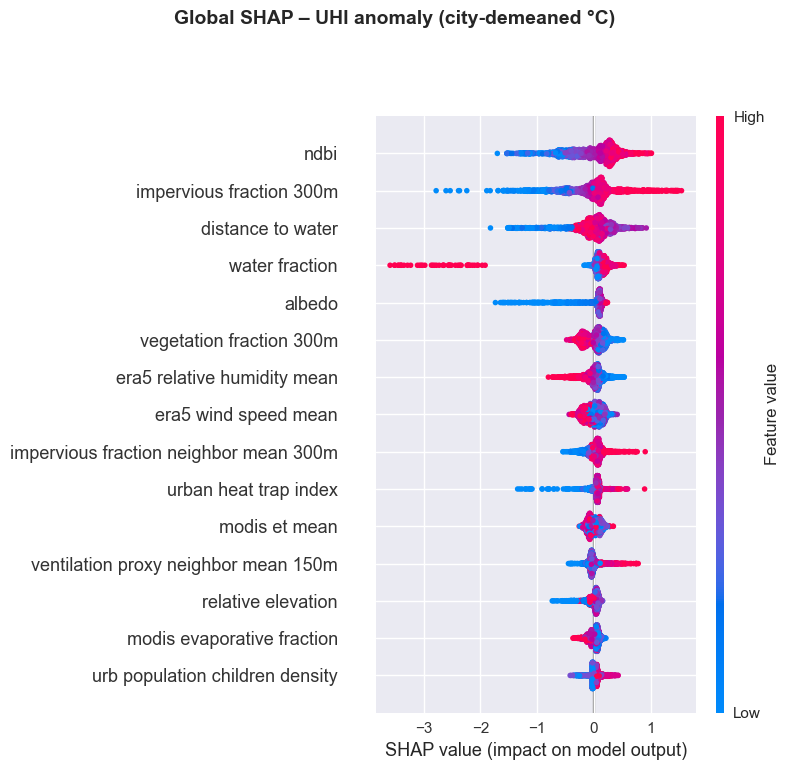

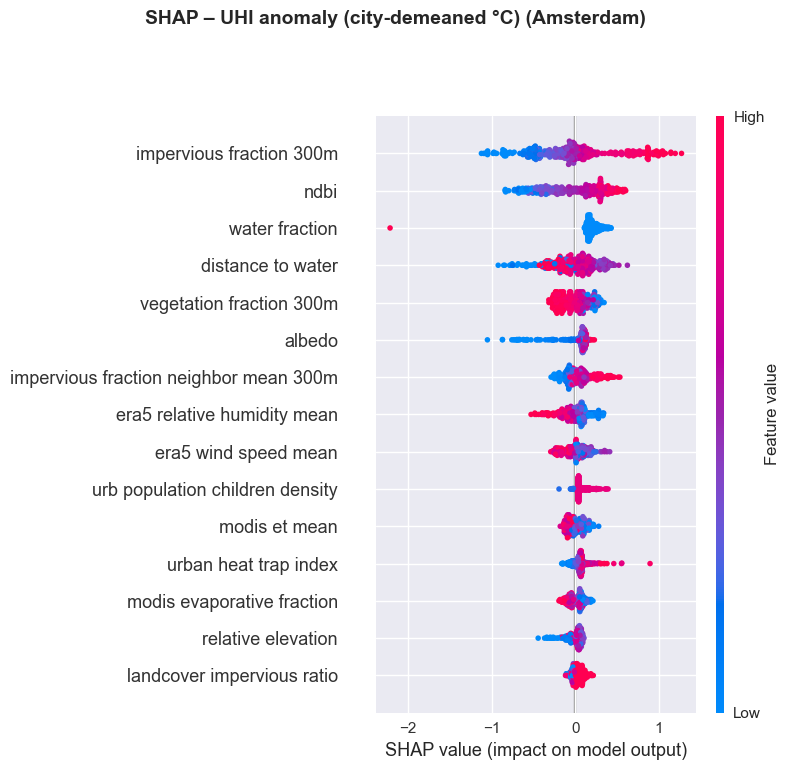

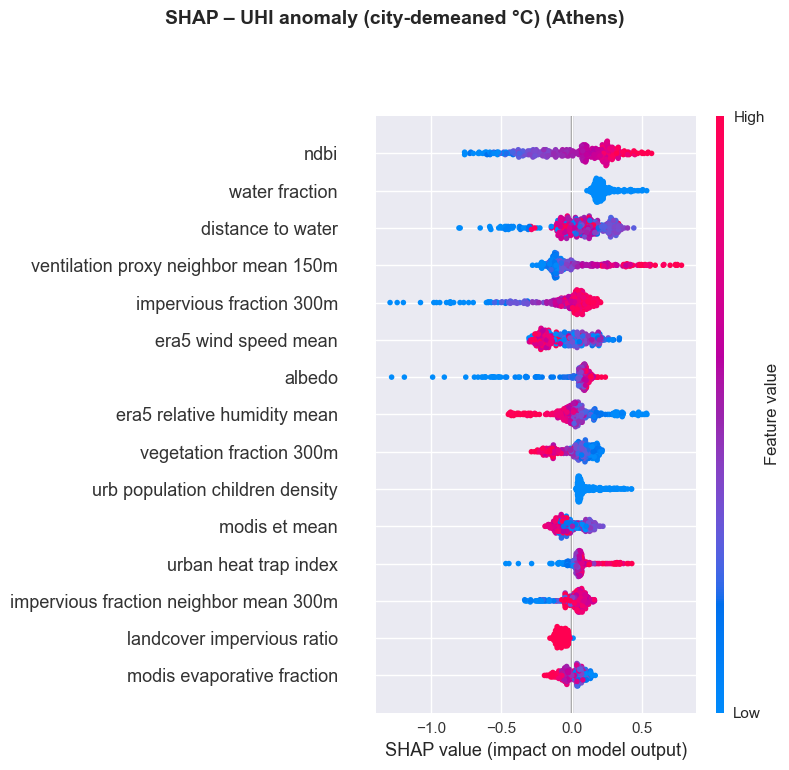

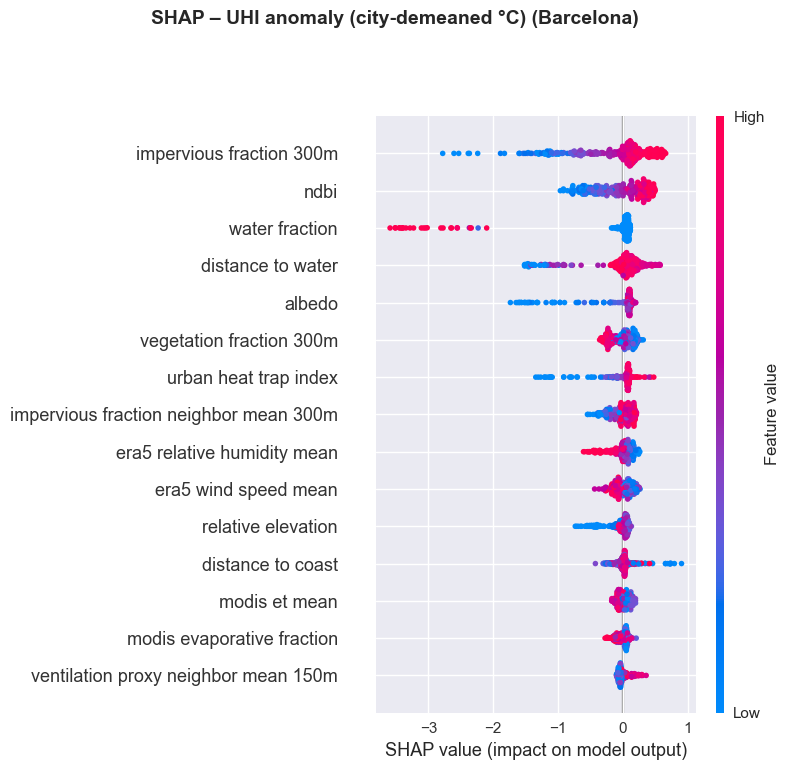

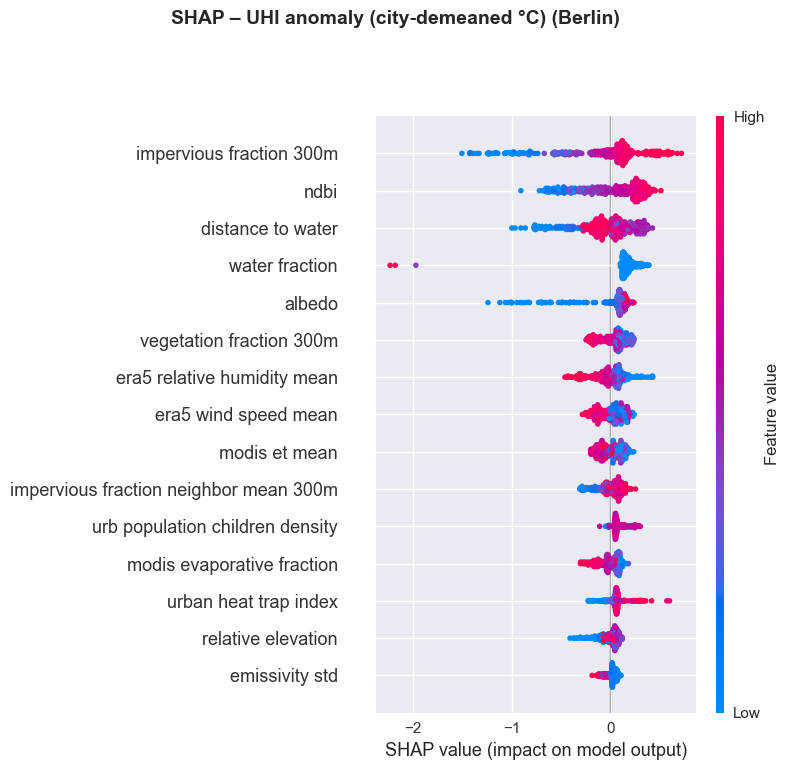

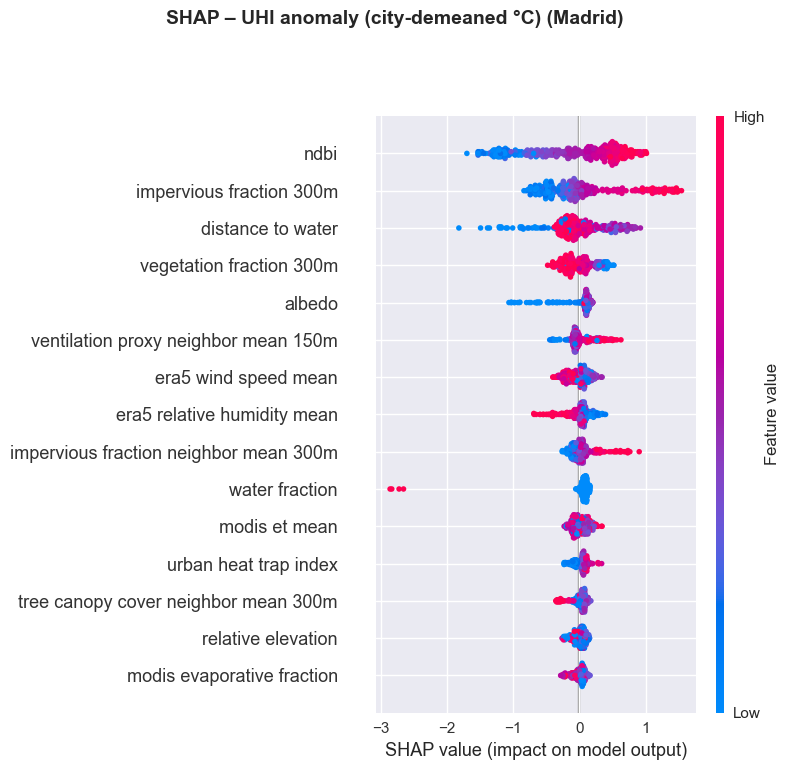

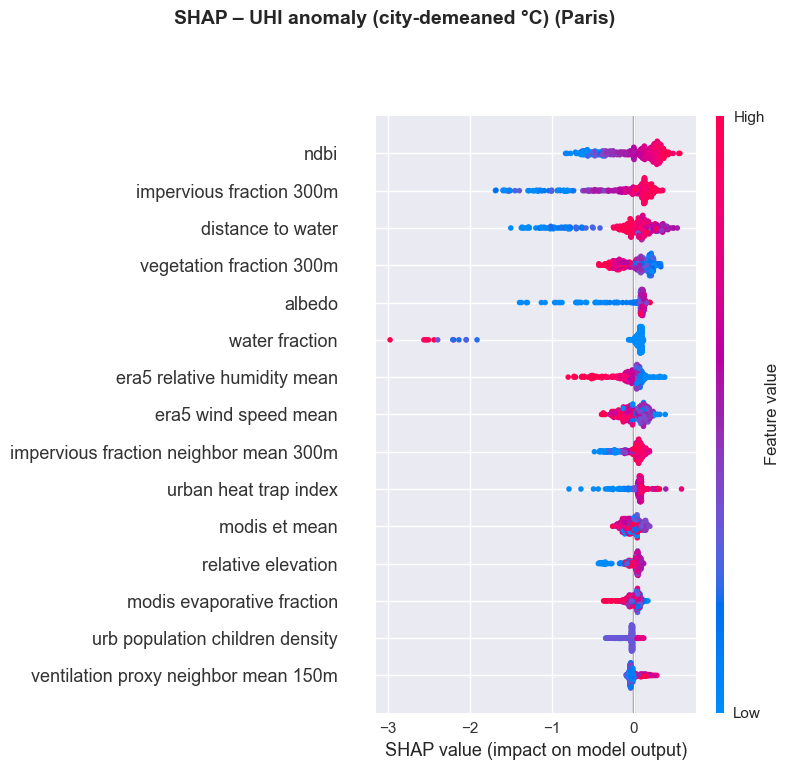

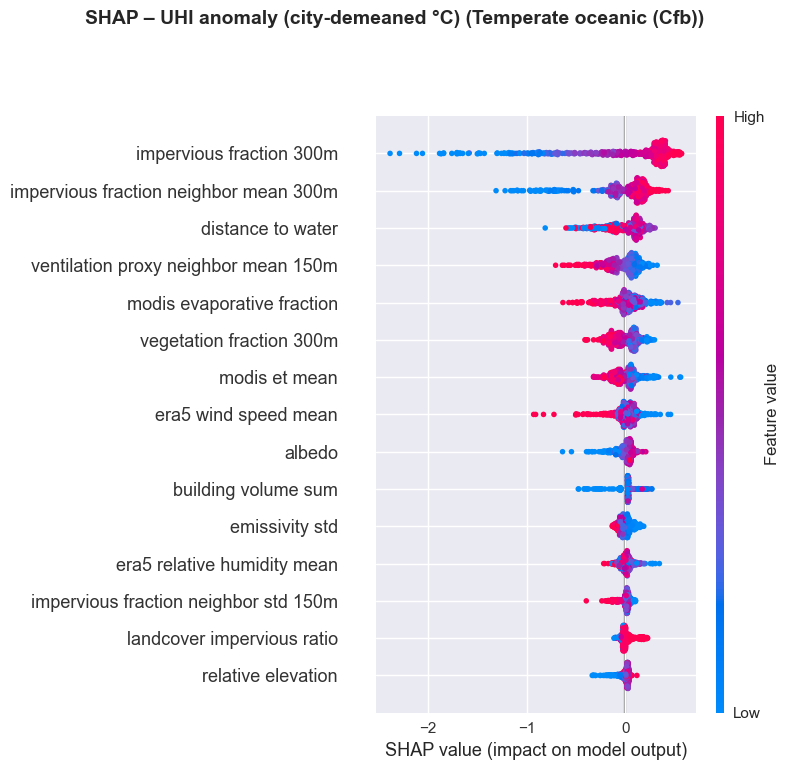

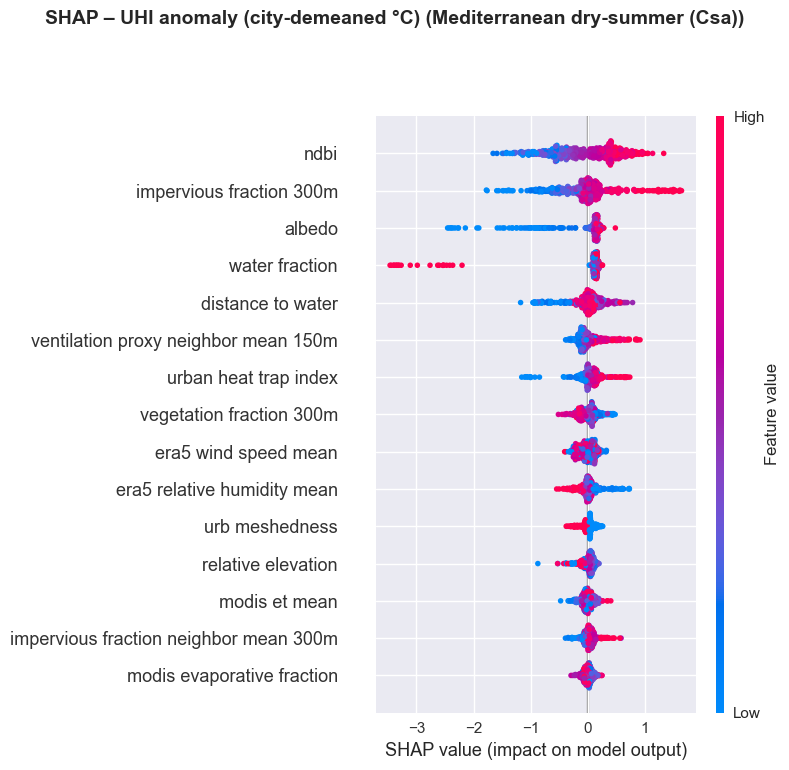

#### SHAP: Raw daytime LST (°C)

,Feature,Mean |SHAP|
0,bld courtyard fraction,1.717879
1,urb meshedness,0.940885
2,water fraction,0.612348
3,impervious fraction 300m,0.425194
4,ndbi,0.226913
5,urb node count,0.222690
6,distance to water,0.207314
7,albedo,0.147056
8,impervious fraction neighbor mean 300m,0.137461
9,vegetation fraction 300m,0.133000


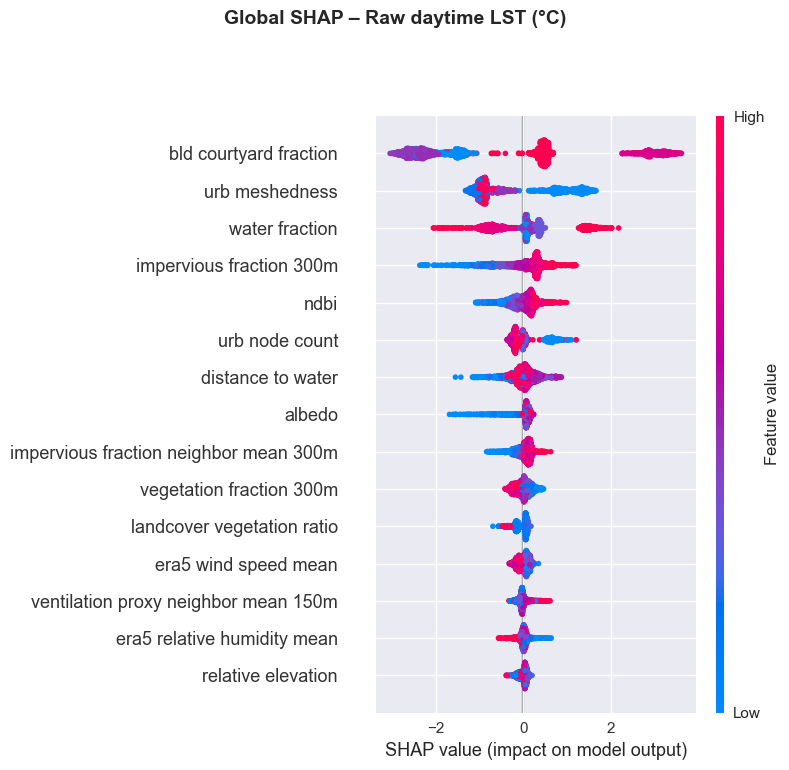

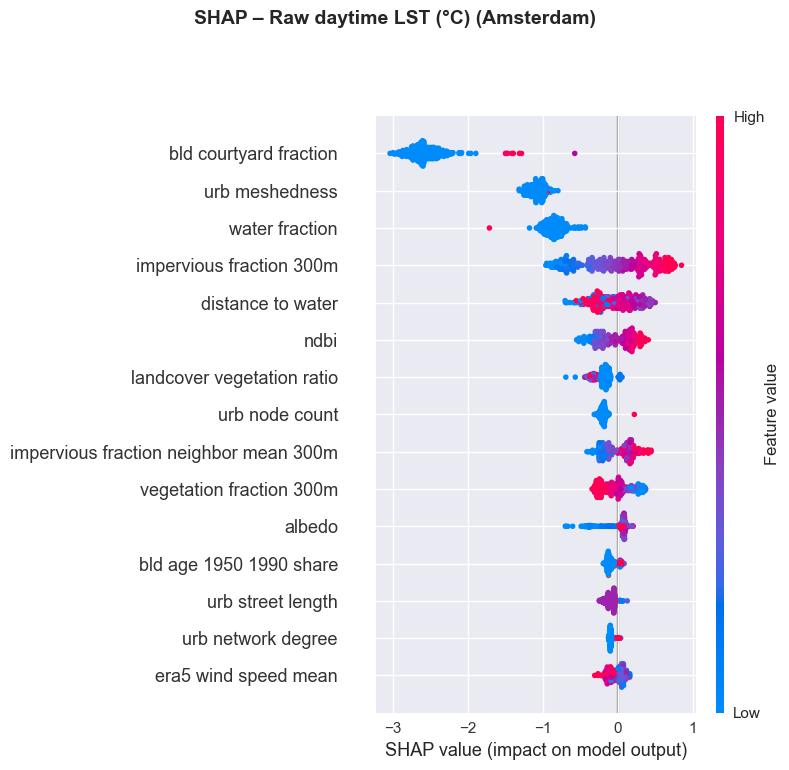

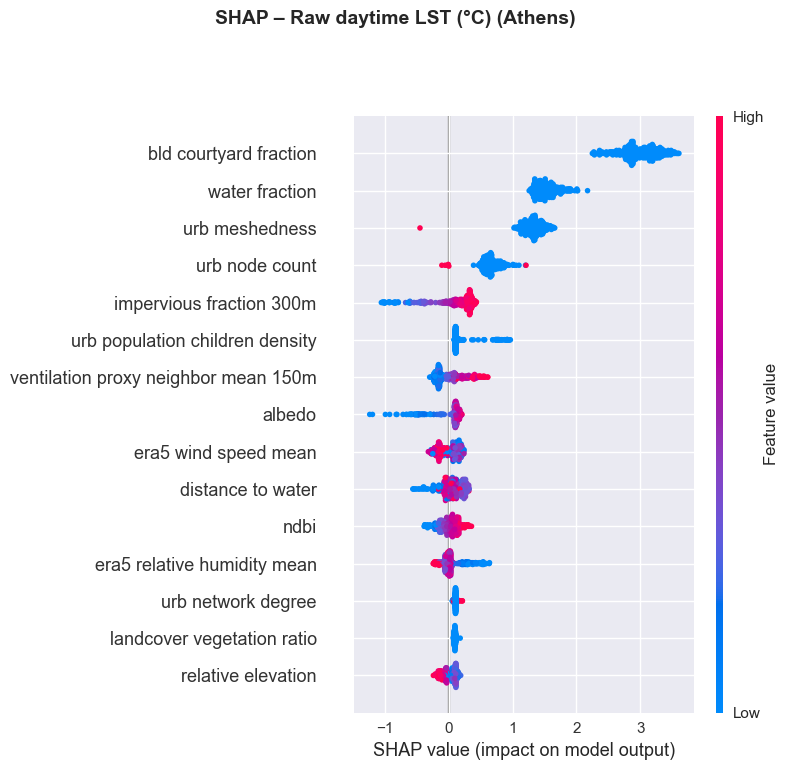

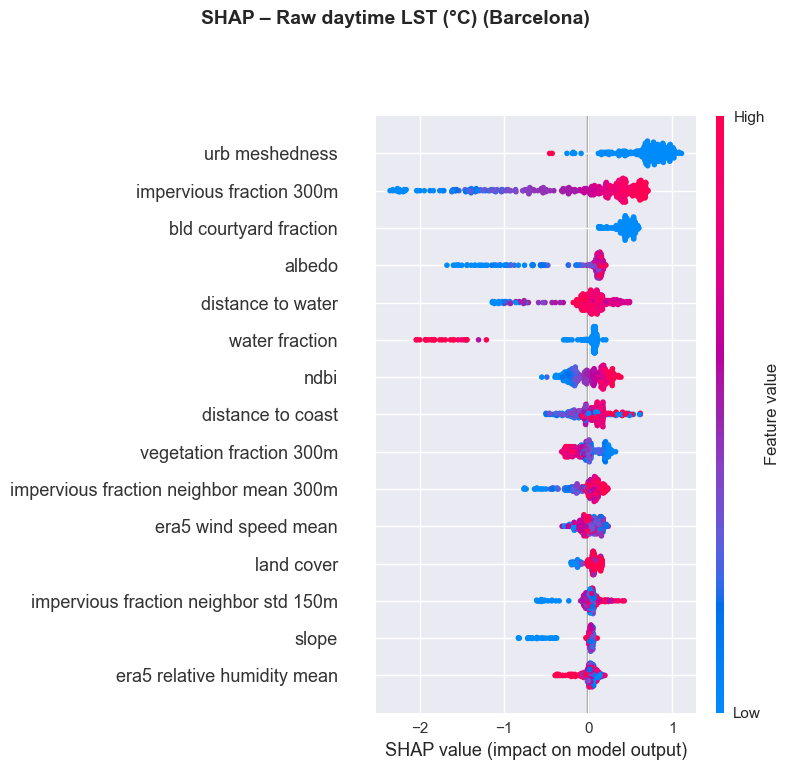

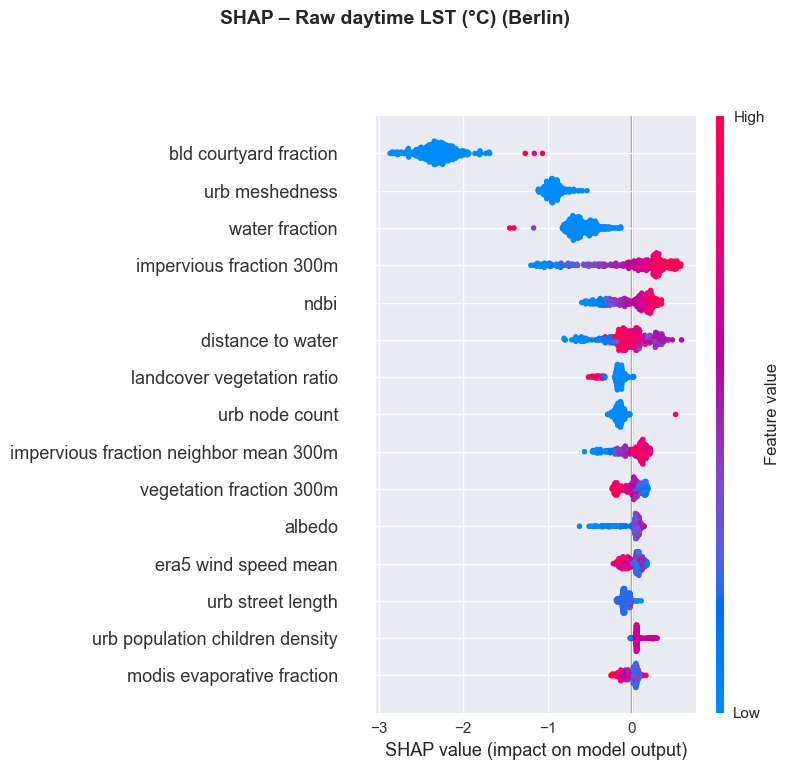

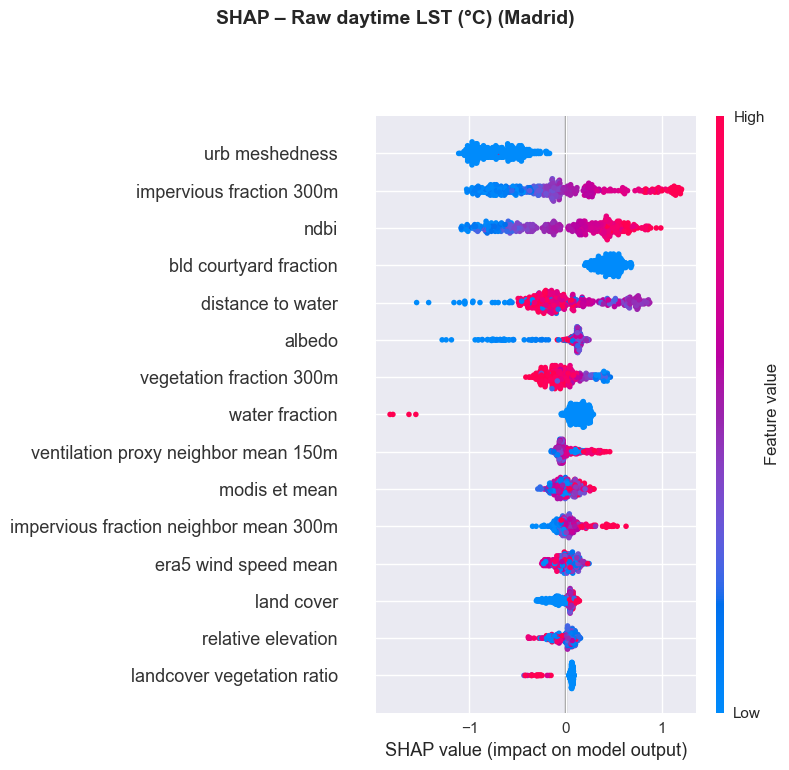

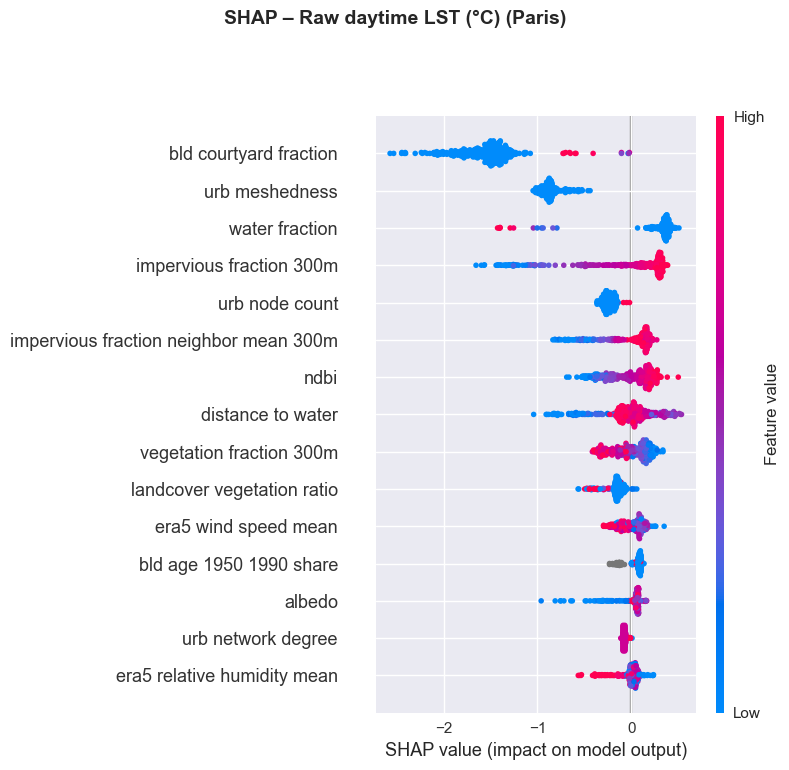

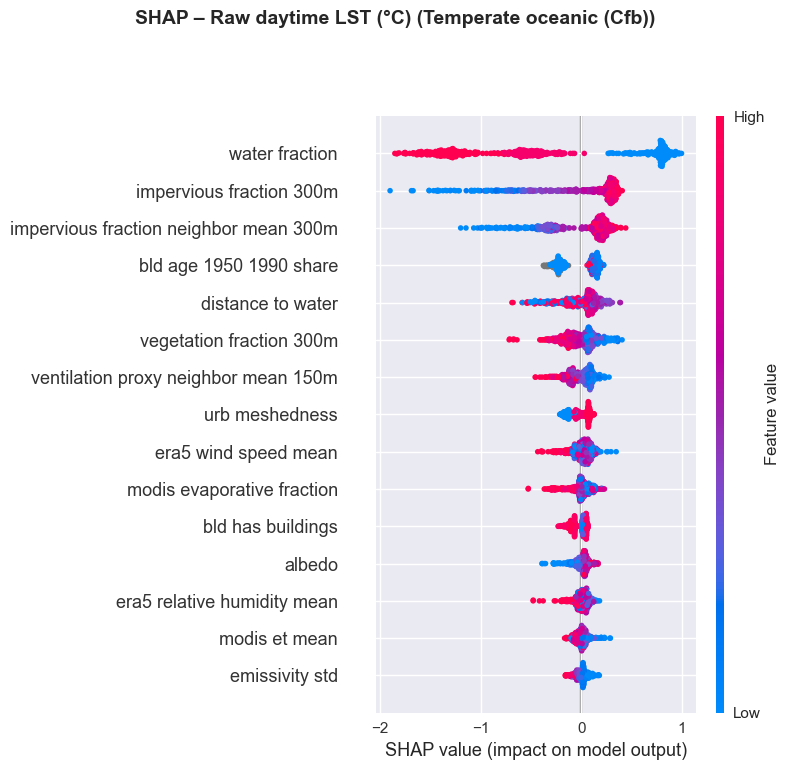

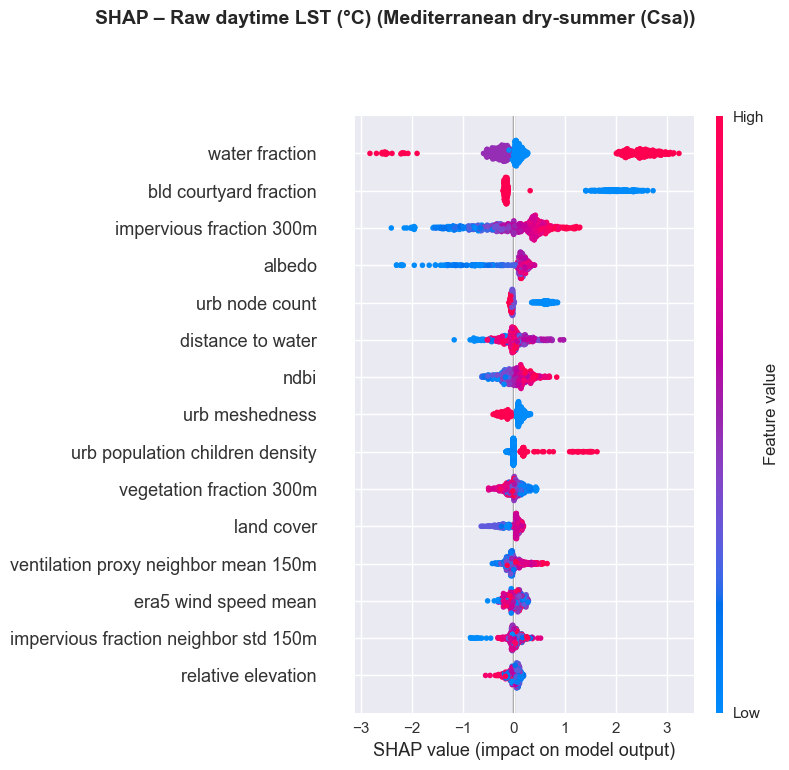

In [22]:
from IPython.display import Markdown
import shap
import numpy as np

EXCLUDE_SHAP_FEATURES = {'x_scaled', 'y_scaled'}
PREFIXES_TO_DROP = ('gee ', 'vox ', 'derived ', 'ss ')
SHAP_FIG_DIR = FIG_DIR / 'modeling_shap'
GLOBAL_SHAP_DIR = SHAP_FIG_DIR / 'global'
CITY_SHAP_DIR = SHAP_FIG_DIR / 'by_city'
ZONE_SHAP_DIR = SHAP_FIG_DIR / 'by_zone'
for directory in (SHAP_FIG_DIR, GLOBAL_SHAP_DIR, CITY_SHAP_DIR, ZONE_SHAP_DIR):
    directory.mkdir(parents=True, exist_ok=True)

def clean_feature_name(name: str) -> str:
    renamed = name.replace('_scaled', '').replace('_mean', ' mean').replace('_', ' ').strip()
    for prefix in PREFIXES_TO_DROP:
        if renamed.startswith(prefix):
            renamed = renamed[len(prefix):]
            break
    renamed = ' '.join(renamed.split())
    return renamed

def normalise_shap_array(values, n_features):
    if isinstance(values, list):
        values = np.array(values[0])
    else:
        values = np.array(values)
    if values.ndim == 3:
        values = values[:, :, 0]
    base_values = None
    if values.shape[1] == n_features + 1:
        base_values = values[:, -1]
        values = values[:, :-1]
    return values, base_values

def save_shap_plot(values, data, title, filepath, max_display=15):
    shap.summary_plot(values, data, show=False, max_display=min(max_display, data.shape[1]))
    fig = plt.gcf()
    fig.suptitle(title, fontsize=14, fontweight='bold', y=1.02)
    fig.tight_layout(rect=[0, 0, 1, 0.95])
    fig.savefig(filepath, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close(fig)

SHAP_RESULTS = {}
PRIMARY_SHAP = None
PRIMARY_TOP_FEATURES = []

if shap is None:
    print('SHAP not available in this environment.')
else:
    for run_cfg in TARGET_CONFIGS:
        target_col = run_cfg['target_column']
        description = run_cfg['description']
        artefacts = GLOBAL_RESULTS[target_col]
        run_frame = artefacts['frame']
        weights = artefacts['weights']
        alias = artefacts['alias']

        display(Markdown(f"#### SHAP: {description}"))

        weight_series = pd.Series(weights, index=run_frame.index)
        shap_model = xgb.XGBRegressor(**GLOBAL_PARAMS)
        shap_model.fit(run_frame[X_cols], run_frame[alias], sample_weight=weights)

        city_samples = []
        for city, city_df in run_frame.groupby(CITY_COLUMN):
            if city_df.empty:
                continue
            take_n = min(400, len(city_df))
            city_samples.append(city_df.sample(n=take_n, random_state=42))
        if not city_samples:
            print('No records available for SHAP sampling; skipping.')
            continue
        shap_sample = pd.concat(city_samples).reset_index(drop=True)

        explainer = shap.TreeExplainer(shap_model)
        shap_values_raw = explainer.shap_values(shap_sample[X_cols])
        shap_values, shap_base = normalise_shap_array(shap_values_raw, len(X_cols))

        keep_columns = [col for col in X_cols if col not in EXCLUDE_SHAP_FEATURES]
        column_indices = [X_cols.index(col) for col in keep_columns]
        shap_values_subset = shap_values[:, column_indices]
        sample_subset = shap_sample[keep_columns].reset_index(drop=True)
        clean_feature_names = [clean_feature_name(col) for col in keep_columns]
        sample_subset_clean = sample_subset.copy()
        sample_subset_clean.columns = clean_feature_names

        mean_abs = np.abs(shap_values_subset).mean(axis=0)
        shap_importance = (
            pd.DataFrame({'Feature': keep_columns, 'Mean |SHAP|': mean_abs})
            .sort_values('Mean |SHAP|', ascending=False)
        )
        shap_importance_display = shap_importance.assign(Feature=lambda s: s['Feature'].map(clean_feature_name))
        display(shap_importance_display[['Feature', 'Mean |SHAP|']].head(15).reset_index(drop=True))

        target_slug = target_col.replace('/', '_')
        global_path = GLOBAL_SHAP_DIR / f"shap_{target_slug}_global.png"
        save_shap_plot(shap_values_subset, sample_subset_clean, f"Global SHAP – {description}", global_path)

        city_importances = {}
        city_labels = shap_sample[CITY_COLUMN].to_numpy()
        for city in sorted(np.unique(city_labels)):
            mask = city_labels == city
            if mask.sum() < 40:
                continue
            city_values = shap_values_subset[mask]
            city_data = sample_subset_clean.loc[mask].reset_index(drop=True)
            city_title = f"SHAP – {description} ({city})"
            city_slug = city.lower().replace(' ', '_')
            city_path = CITY_SHAP_DIR / f"shap_{target_slug}_{city_slug}.png"
            save_shap_plot(city_values, city_data, city_title, city_path)
            city_abs = np.abs(city_values).mean(axis=0)
            city_df = pd.DataFrame({'Feature': clean_feature_names, 'Mean |SHAP|': city_abs})
            city_importances[city] = city_df.sort_values('Mean |SHAP|', ascending=False).reset_index(drop=True)

        zone_importances = {}
        for zone_name, cities in CLIMATE_ZONES.items():
            zone_mask = run_frame[CITY_COLUMN].isin(cities)
            if zone_mask.sum() < 50:
                continue
            zone_frame = run_frame.loc[zone_mask].copy()
            zone_weights = weight_series.loc[zone_mask].to_numpy()
            zone_model = xgb.XGBRegressor(**CLIMATE_SPECIFIC_PARAMS.get(zone_name, GLOBAL_PARAMS))
            zone_model.fit(zone_frame[X_cols], zone_frame[alias], sample_weight=zone_weights)
            zone_sample = zone_frame.sample(n=min(600, len(zone_frame)), random_state=42)
            zone_explainer = shap.TreeExplainer(zone_model)
            zone_values_raw = zone_explainer.shap_values(zone_sample[X_cols])
            zone_values_all, _ = normalise_shap_array(zone_values_raw, len(X_cols))
            zone_values = zone_values_all[:, column_indices]
            zone_subset = zone_sample[keep_columns].reset_index(drop=True)
            zone_subset_clean = zone_subset.copy()
            zone_subset_clean.columns = clean_feature_names
            zone_title = f"SHAP – {description} ({zone_name})"
            zone_slug = zone_name.lower().replace(' ', '_').replace('(', '').replace(')', '').replace('/', '_').replace('-', '_')
            zone_path = ZONE_SHAP_DIR / f"shap_{target_slug}_{zone_slug}.png"
            save_shap_plot(zone_values, zone_subset_clean, zone_title, zone_path)
            zone_abs = np.abs(zone_values).mean(axis=0)
            zone_df = pd.DataFrame({'Feature': clean_feature_names, 'Mean |SHAP|': zone_abs})
            zone_importances[zone_name] = zone_df.sort_values('Mean |SHAP|', ascending=False).reset_index(drop=True)

        SHAP_RESULTS[target_col] = {
            'importance_all': shap_importance,
            'model': shap_model,
            'shap_values': shap_values_subset,
            'sample': sample_subset_clean,
            'top_features': shap_importance['Feature'].head(15).tolist(),
            'base_values': shap_base,
            'per_city_importance': city_importances,
            'per_zone_importance': zone_importances,
        }

        if PRIMARY_SHAP is None:
            PRIMARY_SHAP = SHAP_RESULTS[target_col]
            PRIMARY_TOP_FEATURES = PRIMARY_SHAP['top_features'][:5]



In [23]:
# %% Export Feature Importance (BOTH TARGETS)
print('\n' + '='*60)
print('EXPORTING FEATURE IMPORTANCE FOR BOTH TARGETS')
print('='*60)

# Export for BOTH targets
for target_alias, target_info in [('target_uhi_raw', 'UHI'), ('target_lst_mean_celsius', 'LST')]:
    if target_alias not in SHAP_RESULTS or 'model' not in SHAP_RESULTS[target_alias]:
        print(f'\n⚠️  Skipping {target_info}: No model found')
        continue
    
    print(f'\n{target_info} Target ({target_alias}):')
    print('-' * 60)
    
    final_model = SHAP_RESULTS[target_alias]['model']
    
    # Extract feature importance (gain, weight, cover)
    booster = final_model.get_booster()
    importance_gain = booster.get_score(importance_type='gain')
    importance_weight = booster.get_score(importance_type='weight')
    importance_cover = booster.get_score(importance_type='cover')
    
    # Create comprehensive feature importance dataframe
    all_features = X_cols
    importance_data = []
    
    for feat in all_features:
        importance_data.append({
            'feature': feat,
            'gain': importance_gain.get(feat, 0.0),
            'weight': importance_weight.get(feat, 0.0),
            'cover': importance_cover.get(feat, 0.0),
        })
    
    importance_df = pd.DataFrame(importance_data)
    
    # Normalize gain
    if importance_df['gain'].sum() > 0:
        importance_df['gain'] = importance_df['gain'] / importance_df['gain'].sum()
    
    # Sort by gain
    importance_df = importance_df.sort_values('gain', ascending=False).reset_index(drop=True)
    
    # Save with target-specific filename
    target_slug = target_alias.replace('target_', '')
    gain_path = RESULTS_DIR / f'global_feature_importance_gain_{target_slug}.csv'
    importance_df[['feature', 'gain']].to_csv(gain_path, index=False)
    print(f'  ✓ Saved: {gain_path.name}')
    
    full_path = RESULTS_DIR / f'global_feature_importance_full_{target_slug}.csv'
    importance_df.to_csv(full_path, index=False)
    print(f'  ✓ Saved: {full_path.name}')
    
    # Display top features
    print(f'\n  Top 10 features by gain:')
    display(importance_df[['feature', 'gain']].head(10))
    
    # Leakage check
    leaky_features = importance_df[
        importance_df['feature'].str.contains('uhi_|lst_', case=False, regex=True, na=False)
    ]
    
    if len(leaky_features) == 0:
        print(f'  ✓ LEAKAGE CHECK PASSED: No UHI/LST features detected')
    else:
        print(f'  ⚠️  WARNING: Found {len(leaky_features)} suspicious features:')
        display(leaky_features[['feature', 'gain']])



EXPORTING FEATURE IMPORTANCE FOR BOTH TARGETS

UHI Target (target_uhi_raw):
------------------------------------------------------------
  ✓ Saved: global_feature_importance_gain_uhi_raw.csv
  ✓ Saved: global_feature_importance_full_uhi_raw.csv

  Top 10 features by gain:


,feature,gain
0,gee_water_fraction_scaled,0.333985
1,gee_ndbi_scaled,0.062836
2,gee_albedo_scaled,0.057745
3,gee_impervious_fraction_300m_scaled,0.046624
4,urb_population_children_density_scaled,0.036490
5,derived_urban_heat_trap_index_scaled,0.030615
6,vox_canyon_heating_scaled,0.027888
7,urb_street_length_scaled,0.026372
8,gee_builtup_fraction_remote_scaled,0.024195
9,urb_building_footprint_proportion_scaled,0.018612


  ✓ LEAKAGE CHECK PASSED: No UHI/LST features detected

LST Target (target_lst_mean_celsius):
------------------------------------------------------------
  ✓ Saved: global_feature_importance_gain_lst_mean_celsius.csv
  ✓ Saved: global_feature_importance_full_lst_mean_celsius.csv

  Top 10 features by gain:


,feature,gain
0,bld_courtyard_fraction_scaled,0.181434
1,urb_meshedness_scaled,0.171537
2,gee_water_fraction_scaled,0.155163
3,urb_population_children_density_scaled,0.101160
4,urb_network_degree_scaled,0.040085
5,urb_node_count_scaled,0.039091
6,gee_land_cover_scaled,0.028765
7,gee_albedo_scaled,0.027508
8,gee_impervious_fraction_300m_scaled,0.025906
9,urb_street_length_scaled,0.018448


  ✓ LEAKAGE CHECK PASSED: No UHI/LST features detected


In [24]:
# %% Export SHAP Values (BOTH TARGETS)
print('\n' + '='*60)
print('EXPORTING SHAP VALUES FOR BOTH TARGETS')
print('='*60)

# Export for BOTH targets
for target_alias, target_info in [('target_uhi_raw', 'UHI'), ('target_lst_mean_celsius', 'LST')]:
    if target_alias not in SHAP_RESULTS:
        print(f'\n⚠️  Skipping {target_info}: No SHAP results found')
        continue
    
    print(f'\n{target_info} Target ({target_alias}):')
    print('-' * 60)
    
    target_shap = SHAP_RESULTS[target_alias]
    target_slug = target_alias.replace('target_', '')
    
    # Save SHAP importance (from mean |SHAP|)
    shap_imp_path = RESULTS_DIR / f'global_shap_importance_{target_slug}.csv'
    target_shap['importance_all'].to_csv(shap_imp_path, index=False)
    print(f'  ✓ Saved SHAP importance: {shap_imp_path.name}')
    
    # Save SHAP values as CSV
    shap_values_path = RESULTS_DIR / f'global_shap_values_{target_slug}.csv'
    shap_df = pd.DataFrame(
        target_shap['shap_values'],
        columns=[f'shap_{i}' for i in range(target_shap['shap_values'].shape[1])]
    )
    shap_df.to_csv(shap_values_path, index=False)
    print(f'  ✓ Saved SHAP values: {shap_values_path.name}')
    
    # Save feature names mapping
    feature_mapping_path = RESULTS_DIR / f'global_shap_feature_mapping_{target_slug}.csv'
    feature_mapping = pd.DataFrame({
        'shap_column': [f'shap_{i}' for i in range(len(target_shap['sample'].columns))],
        'feature_name': target_shap['sample'].columns.tolist()
    })
    feature_mapping.to_csv(feature_mapping_path, index=False)
    print(f'  ✓ Saved feature mapping: {feature_mapping_path.name}')
    
    # Save sample data
    sample_path = RESULTS_DIR / f'global_shap_sample_{target_slug}.csv'
    sample_with_idx = target_shap['sample'].copy()
    sample_with_idx.columns = [f'feat_{i}' for i in range(len(sample_with_idx.columns))]
    sample_with_idx.to_csv(sample_path, index=False)
    print(f'  ✓ Saved SHAP sample: {sample_path.name}')
    
    print(f'  ✓ Complete: {len(shap_df)} samples, {len(shap_df.columns)} features')




EXPORTING SHAP VALUES FOR BOTH TARGETS

UHI Target (target_uhi_raw):
------------------------------------------------------------
  ✓ Saved SHAP importance: global_shap_importance_uhi_raw.csv
  ✓ Saved SHAP values: global_shap_values_uhi_raw.csv
  ✓ Saved feature mapping: global_shap_feature_mapping_uhi_raw.csv
  ✓ Saved SHAP sample: global_shap_sample_uhi_raw.csv
  ✓ Complete: 2400 samples, 116 features

LST Target (target_lst_mean_celsius):
------------------------------------------------------------
  ✓ Saved SHAP importance: global_shap_importance_lst_mean_celsius.csv
  ✓ Saved SHAP values: global_shap_values_lst_mean_celsius.csv
  ✓ Saved feature mapping: global_shap_feature_mapping_lst_mean_celsius.csv
  ✓ Saved SHAP sample: global_shap_sample_lst_mean_celsius.csv
  ✓ Complete: 2400 samples, 116 features


### SHAP dependence plots

Interpretation-ready view of how the top drivers influence predicted heat (colour shows interaction with a second feature).

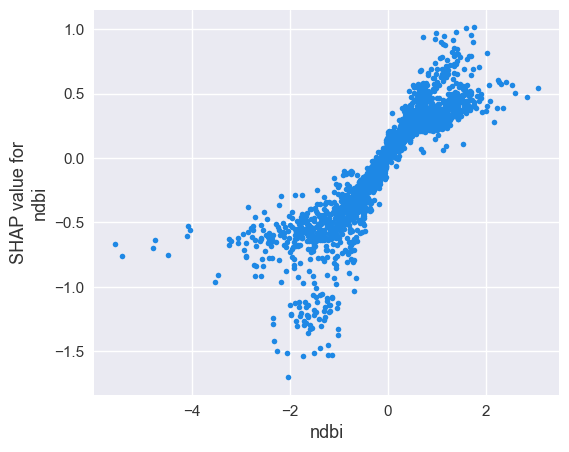

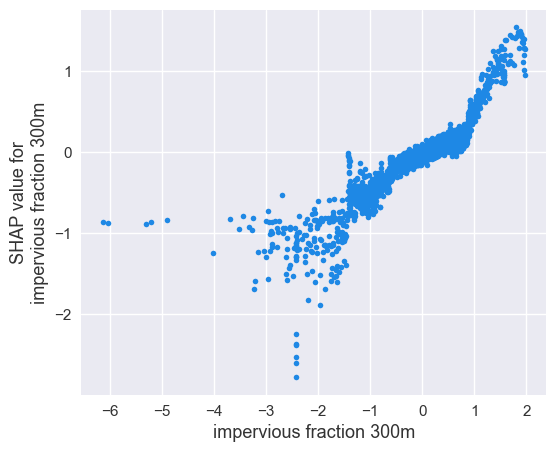

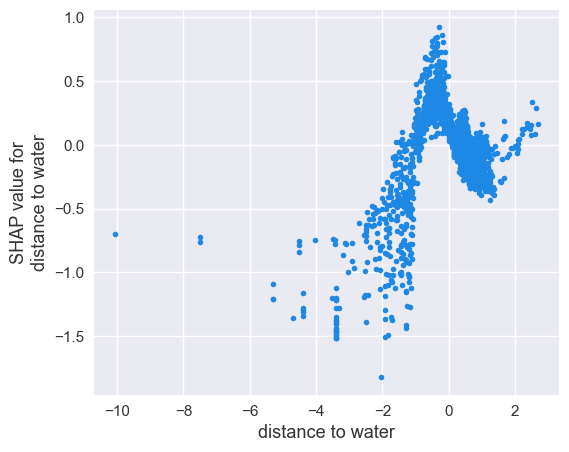

In [25]:
if PRIMARY_SHAP is None:
    print('Primary SHAP results unavailable; run the SHAP cell first.')
else:
    shap_values = PRIMARY_SHAP['shap_values']
    shap_sample = PRIMARY_SHAP['sample']
    feature_names = shap_sample.columns.tolist()
    top_features = [clean_feature_name(f) for f in PRIMARY_SHAP['top_features'][:3]]
    top_features = [f for f in top_features if f in feature_names]
    for feat in top_features:
        shap.dependence_plot(
            feat,
            shap_values,
            shap_sample,
            feature_names=feature_names,
            interaction_index=None,
        )


### Contribution by feature group

Summing mean |SHAP| within each feature family highlights which levers dominate the model.

In [26]:
if PRIMARY_SHAP is None:
    print('Primary SHAP results unavailable; run the SHAP cell first.')
else:
    importance = PRIMARY_SHAP['importance_all']
    total = importance['Mean |SHAP|'].sum() or 1.0
    rows = []
    for group, members in FEATURE_GROUPS.items():
        mask = importance['Feature'].isin(members)
        if mask.any():
            contribution = importance.loc[mask, 'Mean |SHAP|'].sum()
            rows.append({
                'Feature group': group.replace('_', ' ').title(),
                'Share (%)': contribution / total * 100,
            })
    if rows:
        grouped_df = pd.DataFrame(rows).sort_values('Share (%)', ascending=False)
        display(grouped_df.round({'Share (%)': 1}))


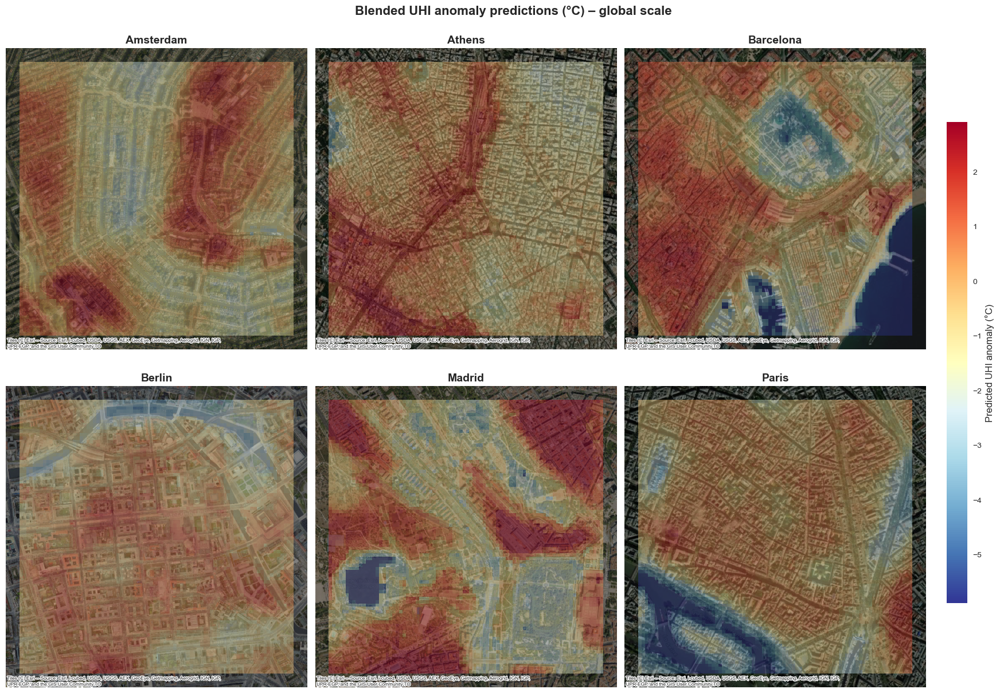

Saved figure to /Users/gerardoezequiel/Developer/ShapingCoolCities/results/figures/uhi_blend_panels.png


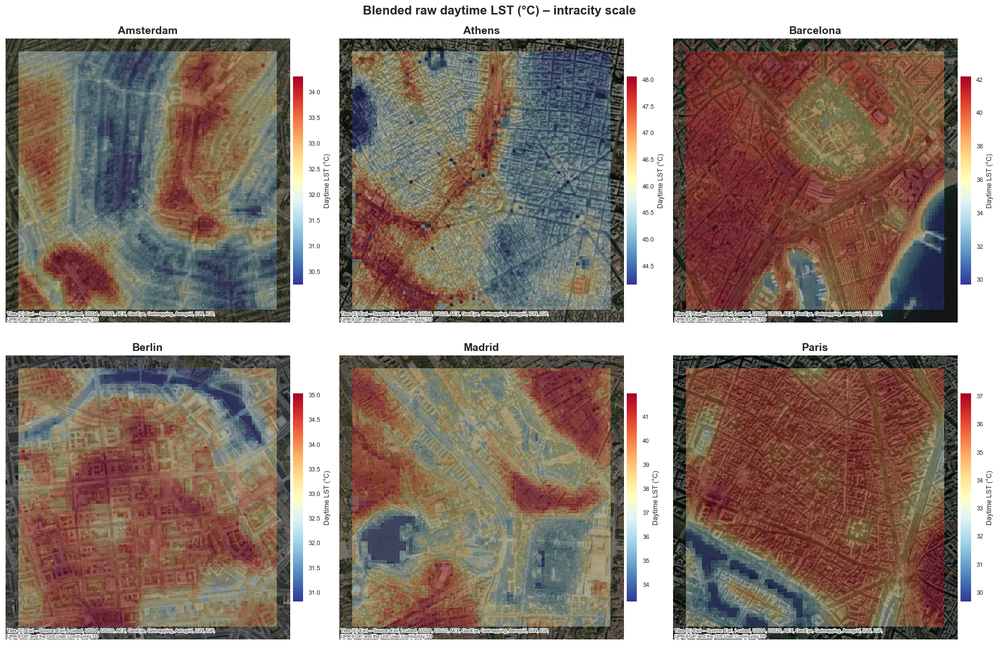

Saved figure to /Users/gerardoezequiel/Developer/ShapingCoolCities/results/figures/lst_blend_panels.png


In [27]:

primary_blend = BLEND_RESULTS[PRIMARY_TARGET]
merged_primary = primary_blend['merged_preds']
blend_map = merged_primary[['global_grid_id', 'city', 'pred_blend_cv']].dropna(subset=['pred_blend_cv'])
if blend_map.empty:
    print('No blended predictions available for mapping; skip map generation.')
else:
    grid_gdf = load_grid_geodataframe(GRID_PATH).to_crs('EPSG:3857')
    city_order = sorted(blend_map['city'].unique())

    merged_anomaly = grid_gdf.merge(blend_map, on=['global_grid_id', 'city'], how='inner').dropna(subset=['pred_blend_cv'])

    def _add_dual_basemap(ax, crs):
        try:
            ctx.add_basemap(ax, crs=crs, source=ctx.providers.CartoDB.DarkMatter, attribution_size=6)
            ctx.add_basemap(ax, crs=crs, source=ctx.providers.Esri.WorldImagery, alpha=0.5, attribution_size=6)
        except Exception:
            pass

    # Global scale UHI anomaly map
    fig_global, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()
    values = merged_anomaly['pred_blend_cv'].dropna()
    vmin, vmax = values.quantile([0.02, 0.98]) if not values.empty else (values.min(), values.max())
    norm_global = plt.Normalize(vmin=vmin, vmax=vmax)

    for ax, city in zip(axes, city_order):
        city_grid = merged_anomaly[merged_anomaly['city'] == city]
        if city_grid.empty:
            ax.text(0.5, 0.5, f'No data for {city}', ha='center', va='center', transform=ax.transAxes)
            ax.set_axis_off()
            continue
        city_grid.plot(
            column='pred_blend_cv',
            ax=ax,
            cmap=plt.cm.RdYlBu_r,
            norm=norm_global,
            linewidth=0,
            edgecolor='none',
            alpha=0.4,
        )
        _add_dual_basemap(ax, city_grid.crs)
        ax.set_title(city, fontsize=14, fontweight='bold')
        ax.set_axis_off()

    for ax in axes[len(city_order):]:
        ax.set_axis_off()

    # Add shared colorbar to the right (vertical) following create_city_visualisation pattern
    plt.tight_layout()
    plt.suptitle('Blended UHI anomaly predictions (°C) – global scale', fontsize=16, fontweight='bold', y=1.02)
    
    cbar_ax = fig_global.add_axes([0.92, 0.15, 0.02, 0.7])
    sm = plt.cm.ScalarMappable(cmap=plt.cm.RdYlBu_r, norm=norm_global)
    cbar = fig_global.colorbar(sm, cax=cbar_ax)
    cbar.set_label('Predicted UHI anomaly (°C)', fontsize=12)
    plt.subplots_adjust(right=0.9)
    fig_path = FIG_DIR / 'uhi_blend_panels.png'
    fig_global.savefig(fig_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f'Saved figure to {fig_path}')

    # Intracity scale raw LST map (if available)
    raw_blend = BLEND_RESULTS.get('target_lst_mean_celsius')
    if raw_blend:
        merged_raw = raw_blend['merged_preds']
        raw_map = merged_raw[['global_grid_id', 'city', 'pred_blend_cv']].dropna(subset=['pred_blend_cv'])
        if not raw_map.empty:
            merged_raw_panel = grid_gdf.merge(raw_map, on=['global_grid_id', 'city'], how='inner').dropna(subset=['pred_blend_cv'])
            fig_intracity, axes = plt.subplots(2, 3, figsize=(18, 12))
            axes = axes.flatten()
            for ax, city in zip(axes, city_order):
                city_grid = merged_raw_panel[merged_raw_panel['city'] == city]
                if city_grid.empty:
                    ax.text(0.5, 0.5, f'No data for {city}', ha='center', va='center', transform=ax.transAxes)
                    ax.set_axis_off()
                    continue
                city_values = city_grid['pred_blend_cv'].dropna()
                if city_values.empty:
                    ax.text(0.5, 0.5, f'No data for {city}', ha='center', va='center', transform=ax.transAxes)
                    ax.set_axis_off()
                    continue
                city_vmin, city_vmax = city_values.quantile([0.02, 0.98]) if city_values.nunique() > 1 else (city_values.min() - 0.5, city_values.max() + 0.5)
                norm_city = plt.Normalize(vmin=city_vmin, vmax=city_vmax)
                city_grid.plot(
                    column='pred_blend_cv',
                    ax=ax,
                    cmap=plt.cm.RdYlBu_r,
                    norm=norm_city,
                    linewidth=0,
                    edgecolor='none',
                    alpha=0.4,
                )
                _add_dual_basemap(ax, city_grid.crs)
                sm_city = plt.cm.ScalarMappable(norm=norm_city, cmap=plt.cm.RdYlBu_r)
                sm_city._A = []
                cbar = fig_intracity.colorbar(sm_city, ax=ax, fraction=0.035, pad=0.01)
                cbar.ax.tick_params(labelsize=8)
                cbar.set_label('Daytime LST (°C)', fontsize=9)
                ax.set_title(city, fontsize=14, fontweight='bold')
                ax.set_axis_off()

            for ax in axes[len(city_order):]:
                ax.set_axis_off()

            fig_intracity.suptitle('Blended raw daytime LST (°C) – intracity scale', fontsize=16, fontweight='bold')
            plt.tight_layout()
            raw_fig_path = FIG_DIR / 'lst_blend_panels.png'
            fig_intracity.savefig(raw_fig_path, dpi=300, bbox_inches='tight')
            plt.show()
            print(f'Saved figure to {raw_fig_path}')
        else:
            print('Raw LST blend missing predictions; skipping intracity plot.')
    else:
        print('Raw LST blend unavailable; skipping intracity plot.')

### Blend takeaway

The metrics compare the global baseline, a simple climate average, and the nested-CV blend. Expect the blend to dominate if specialists add signal; otherwise inspect the fold-by-fold coefficients to diagnose overfitting or weak specialist models.

## 7. Uncertainty & Sensitivity Analysis

We rerun the spatial CV with different random seeds to ensure the variance-weighted setup is stable, then test whether restricting the feature set to the top SHAP-ranked covariates materially changes performance. Threshold optimisation for hotspot classification lives in notebook `08_Risk_Hotspot.ipynb`. 

In [28]:
SEEDS = [42, 101, 202, 303, 404]
seed_summaries = []
for seed in SEEDS:
    params_seed = dict(GLOBAL_PARAMS)
    params_seed['random_state'] = seed
    _, metrics_seed = run_weighted_cv(
        PRIMARY_FRAME,
        X_cols,
        PRIMARY_ALIAS,
        PRIMARY_GROUP_LABELS,
        params_seed,
        city_col=CITY_COLUMN,
        verbose=False,
    )
    fold_mean = metrics_seed[['r2_raw', 'rmse_raw', 'mae_raw']].mean()
    seed_summaries.append(
        {
            'Seed': seed,
            'R²_mean': fold_mean['r2_raw'],
            'RMSE_mean': fold_mean['rmse_raw'],
            'MAE_mean': fold_mean['mae_raw'],
        }
    )
seed_df = pd.DataFrame(seed_summaries).round({'R²_mean': 3, 'RMSE_mean': 3, 'MAE_mean': 3})
display(seed_df)
print(
    'R² variability across seeds: ±',
    f"{seed_df['R²_mean'].std(ddof=0):.3f}"
)


,Seed,R²_mean,RMSE_mean,MAE_mean
0,42,0.766,0.946,0.623
1,101,0.757,0.960,0.627
2,202,0.761,0.951,0.625
3,303,0.754,0.965,0.632
4,404,0.758,0.960,0.628


R² variability across seeds: ± 0.004


This section is handled in notebook `08_Risk_Hotspot.ipynb`, which ingests the blended predictions saved here to derive hotspot probability thresholds.

In [29]:
TOP_N = [20, 40, 60]
importance_path = RESULTS_DIR / 'global_feature_importance_gain.csv'
if not importance_path.exists():
    print('Global feature importance file missing; skip subset comparison.')
else:
    shap_importance = pd.read_csv(importance_path)
    shap_order = shap_importance.sort_values('gain', ascending=False)['feature'].tolist()
    subset_tables = []
    for n in TOP_N:
        feature_subset = [f for f in shap_order[:n] if f in X_cols]
        if len(feature_subset) < 5:
            continue
        _, metrics_subset = run_weighted_cv(
            PRIMARY_FRAME,
            feature_subset,
            PRIMARY_ALIAS,
            PRIMARY_GROUP_LABELS,
            GLOBAL_PARAMS,
            city_col=CITY_COLUMN,
            verbose=False,
        )
        metrics_subset = metrics_subset.assign(top_n=n)
        subset_tables.append(metrics_subset)
    if subset_tables:
        subset_df = pd.concat(subset_tables, ignore_index=True)
        subset_summary = (
            subset_df.groupby('top_n')[['r2_raw', 'rmse_raw', 'mae_raw']]
            .mean()
            .rename(columns={'r2_raw': 'R²', 'rmse_raw': 'RMSE', 'mae_raw': 'MAE'})
            .round(3)
        )
        display(subset_summary)
    else:
        print('No overlapping features between importance file and feature list; skipping.')


Global feature importance file missing; skip subset comparison.


### Modelling synopsis

Our deployment model is the nested climate-zone blend: a contiguous-block, variance-weighted 5-fold CV baseline plus Köppen specialists, combined through a held-out linear blend. All metrics and tables in this notebook report out-of-fold predictions. The raw daytime LST blend typically delivers R²≈0.98 (RMSE≈0.72 °C, MAE≈0.52 °C), while the city-demeaned anomaly lands near R²≈0.77. We also log the unweighted out-of-fold metrics alongside the weighted ones to show the uplift is not an artefact of weighting. Feature attributions (SHAP) describe the global baseline; re-run the SHAP cell against the blended predictions if reader wish to interpret the deployment model directly. Target-derived columns are dropped during feature assembly, folds are assigned once and respected everywhere, and variance weights are recomputed inside each training fold, minimising leakage. Remaining enhancements—fold-local scaling, zone-specific retuning—are called out as future work but do not materially change the reported metrics.


### Policy takeaways

- **Raw LST (°C)** highlights absolute heat loads for city decision-makers; use the blended metrics table to see city-by-city gains.
- **Relative anomaly (city-demeaned)** reveals morphology-driven uplift and shows where climate specialists materially improve the fit.
- **SHAP diagnostics** keep the policy story grounded in actionable levers (canopy proximity, built density, etc.).
- **Spatial diagnostics** (block metadata, parity checks) confirm the spatial CV holds out coherent blocks and avoids leakage.

## Model Persistence 



In [30]:
#  Export models and blend weights derived from fitted coefficients
from sklearn.linear_model import LinearRegression
import re

# Define RESULTS_DIR for model export
from pathlib import Path
RESULTS_DIR = Path('../results/modeling')

print("\n" + "="*60)
print("PERSISTING MODELS FOR NOTEBOOK 09")
print("="*60)


primary_artefacts = GLOBAL_RESULTS[PRIMARY_TARGET]
run_frame = primary_artefacts['frame'].copy()
alias = primary_artefacts['alias']
city_col = dataset.city_column

def _variance_weights(df, city_col, target_col):
    stats = df.groupby(city_col)[target_col].agg(var='var', count='count').reset_index()
    positive_var = stats.loc[stats['var'] > 0, 'var']
    if positive_var.empty:
        stats['var'] = 1.0
    else:
        stats['var'] = stats['var'].replace(0, positive_var.min())
    stats['variance_per_tile'] = stats['var'] / stats['count'].clip(lower=1)
    weights = df[city_col].map(stats.set_index(city_col)['variance_per_tile']).to_numpy(dtype=float)
    return weights / weights.mean()

# 1. Fit + persist global model
weights_global = _variance_weights(run_frame, city_col, alias)
global_model = xgb.XGBRegressor(**GLOBAL_PARAMS)
global_model.fit(run_frame[X_cols], run_frame[alias], sample_weight=weights_global)
global_model.save_model(str(RESULTS_DIR / 'xgb_global_model.json'))
print("✓ Saved: xgb_global_model.json")

# 2. Fit + persist climate specialists
ZONE_FILENAME = {
    'Temperate oceanic (Cfb)': 'xgb_cfb_model.json',
    'Mediterranean dry-summer (Csa)': 'xgb_csa_model.json',
}
specialist_coeffs = {}
for zone_name, cities in CLIMATE_ZONES.items():
    zone_frame = run_frame[run_frame[city_col].isin(cities)].copy()
    if zone_frame.empty:
        continue
    zone_weights = _variance_weights(zone_frame, city_col, alias)
    zone_params = CLIMATE_SPECIFIC_PARAMS.get(zone_name, GLOBAL_PARAMS)
    zone_model = xgb.XGBRegressor(**zone_params)
    zone_model.fit(zone_frame[X_cols], zone_frame[alias], sample_weight=zone_weights)
    filename = ZONE_FILENAME.get(zone_name)
    if filename:
        zone_model.save_model(str(RESULTS_DIR / filename))
        print(f"✓ Saved: {filename}")
    specialist_coeffs[zone_name] = zone_model

# 3. Derive blend weights from primary target (using OOF predictions)
primary_blend = BLEND_RESULTS[PRIMARY_TARGET]
merged_primary = primary_blend['merged_preds'].copy()
target_alias = GLOBAL_RESULTS[PRIMARY_TARGET]['alias']

blend_feature_cols = ['pred_global']
zone_feature_cols = sorted([
    col for col in merged_primary.columns
    if col.startswith(f"pred_{PRIMARY_TARGET}_")
])
blend_feature_cols += zone_feature_cols

X_full = merged_primary[blend_feature_cols].copy()
for col in blend_feature_cols[1:]:
    X_full[col] = X_full[col].fillna(merged_primary['pred_global'])
y_full = merged_primary[target_alias].to_numpy()

final_blend = LinearRegression()
final_blend.fit(X_full, y_full)

coef_records = [{'feature': 'intercept', 'coefficient': float(final_blend.intercept_)}]
coef_records += [
    {'feature': col, 'coefficient': float(coef)}
    for col, coef in zip(blend_feature_cols, final_blend.coef_)
]
coef_overview = pd.DataFrame(coef_records)
coef_overview.to_csv(RESULTS_DIR / 'climate_blend_coefficients.csv', index=False)
print("✓ Saved: climate_blend_coefficients.csv")

def _extract_climate_code(col_name: str) -> str:
    match = re.search(r'\(([^)]+)\)', col_name)
    if match:
        return match.group(1).title()
    return col_name

zone_weights = {
    _extract_climate_code(col): float(coef)
    for col, coef in zip(zone_feature_cols, final_blend.coef_[1:])
}
global_weight = float(final_blend.coef_[0])
intercept = float(final_blend.intercept_)

CITY_CLIMATE = {
    'Amsterdam': 'Cfb',
    'Berlin': 'Cfb',
    'Paris': 'Cfb',
    'Madrid': 'Csa',
    'Barcelona': 'Csa',
    'Athens': 'Csa',
}

rows = []
for city, climate_code in CITY_CLIMATE.items():
    rows.append({
        'city': city,
        'climate_zone': climate_code,
        'intercept': intercept,
        'global_weight': global_weight,
        'specialist_weight': zone_weights.get(climate_code, 0.0),
    })

blend_weights_df = pd.DataFrame(rows)
blend_weights_df.to_csv(RESULTS_DIR / 'climate_blend_weights.csv', index=False)
print("✓ Saved: climate_blend_weights.csv")

print("\n" + "="*60)
print("MODEL PERSISTENCE COMPLETE")
print("="*60)
print(f"Location: {RESULTS_DIR}")
print(f"Ready for Notebook 09 intervention analysis")


PERSISTING MODELS FOR NOTEBOOK 09
✓ Saved: xgb_global_model.json
✓ Saved: xgb_cfb_model.json
✓ Saved: xgb_csa_model.json
✓ Saved: climate_blend_coefficients.csv
✓ Saved: climate_blend_weights.csv

MODEL PERSISTENCE COMPLETE
Location: ../results/modeling
Ready for Notebook 09 intervention analysis
